# 데이터 불러오기

In [1]:
from sklearn.metrics import mean_squared_log_error, mean_squared_error,  r2_score, mean_absolute_error
from sklearn.model_selection import train_test_split
from scipy import stats
warnings.simplefilter('ignore')

pd.options.display.float_format = '{:,.2f}'.format
pd.options.display.max_rows = 10
pd.options.display.max_columns = 10

In [2]:
link = './Data/BikeSharingDemand/' + os.listdir('./Data/BikeSharingDemand')[0]
raw_all = pd.read_csv(link)
raw_all

,datetime,season,holiday,workingday,weather,...,humidity,windspeed,casual,registered,count
0,2011-01-01 0:00,1,0,0,1,...,81,0.00,3,13,16
1,2011-01-01 1:00,1,0,0,1,...,80,0.00,8,32,40
2,2011-01-01 2:00,1,0,0,1,...,80,0.00,5,27,32
3,2011-01-01 3:00,1,0,0,1,...,75,0.00,3,10,13
4,2011-01-01 4:00,1,0,0,1,...,75,0.00,0,1,1
...,...,...,...,...,...,...,...,...,...,...,...
17374,2012-12-31 19:00,1,0,1,2,...,60,11.00,11,108,119
17375,2012-12-31 20:00,1,0,1,2,...,60,11.00,8,81,89
17376,2012-12-31 21:00,1,0,1,1,...,60,11.00,7,83,90
17377,2012-12-31 22:00,1,0,1,1,...,56,9.00,13,48,61


# Feature Engineering : 데이터에서 시계열 패털 추출하기

In [3]:
# raw_all.shape
# raw_all.ndim
# raw_all.tail()
# raw_all.describe(include='all')
raw_all.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 17379 entries, 0 to 17378
Data columns (total 12 columns):
 #   Column      Non-Null Count  Dtype  
---  ------      --------------  -----  
 0   datetime    17379 non-null  object 
 1   season      17379 non-null  int64  
 2   holiday     17379 non-null  int64  
 3   workingday  17379 non-null  int64  
 4   weather     17379 non-null  int64  
 5   temp        17379 non-null  float64
 6   atemp       17379 non-null  float64
 7   humidity    17379 non-null  int64  
 8   windspeed   17379 non-null  float64
 9   casual      17379 non-null  int64  
 10  registered  17379 non-null  int64  
 11  count       17379 non-null  int64  
dtypes: float64(3), int64(8), object(1)
memory usage: 1.6+ MB


In [4]:
raw_all.describe(include='all')

,datetime,season,holiday,workingday,weather,...,humidity,windspeed,casual,registered,count
count,17379,"17,379.00","17,379.00","17,379.00","17,379.00",...,"17,379.00","17,379.00","17,379.00","17,379.00","17,379.00"
unique,17379,nan,nan,nan,nan,...,nan,nan,nan,nan,nan
top,2011-12-11 12:00,nan,nan,nan,nan,...,nan,nan,nan,nan,nan
freq,1,nan,nan,nan,nan,...,nan,nan,nan,nan,nan
mean,NaN,2.50,0.03,0.68,1.43,...,62.72,12.74,35.68,153.79,189.46
...,...,...,...,...,...,...,...,...,...,...,...
min,NaN,1.00,0.00,0.00,1.00,...,0.00,0.00,0.00,0.00,1.00
25%,NaN,2.00,0.00,0.00,1.00,...,48.00,7.00,4.00,34.00,40.00
50%,NaN,3.00,0.00,1.00,1.00,...,63.00,13.00,17.00,115.00,142.00
75%,NaN,3.00,0.00,1.00,2.00,...,78.00,17.00,48.00,220.00,281.00


- datetime column을 날짜화해야함

In [5]:
if 'datetime' in raw_all.columns:
    raw_all['datetime'] = pd.to_datetime(raw_all['datetime'])
    raw_all['DateTime'] = pd.to_datetime(
        raw_all['datetime'])  # 다른 활용을 위해 하나 더 추가

In [6]:
raw_all.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 17379 entries, 0 to 17378
Data columns (total 13 columns):
 #   Column      Non-Null Count  Dtype         
---  ------      --------------  -----         
 0   datetime    17379 non-null  datetime64[ns]
 1   season      17379 non-null  int64         
 2   holiday     17379 non-null  int64         
 3   workingday  17379 non-null  int64         
 4   weather     17379 non-null  int64         
 5   temp        17379 non-null  float64       
 6   atemp       17379 non-null  float64       
 7   humidity    17379 non-null  int64         
 8   windspeed   17379 non-null  float64       
 9   casual      17379 non-null  int64         
 10  registered  17379 non-null  int64         
 11  count       17379 non-null  int64         
 12  DateTime    17379 non-null  datetime64[ns]
dtypes: datetime64[ns](2), float64(3), int64(8)
memory usage: 1.7 MB


- datetime 칼럼 dtype이 object에서 datetime으로 변경됨

- 인덱스를 datetime으로 변경하자.
    - 이거땜에 DateTime만듬ㅋ
   

In [7]:
raw_all = raw_all.set_index(['DateTime'])
raw_all

,datetime,season,holiday,workingday,weather,...,humidity,windspeed,casual,registered,count
DateTime,,,,,,,,,,,
2011-01-01 00:00:00,2011-01-01 00:00:00,1,0,0,1,...,81,0.00,3,13,16
2011-01-01 01:00:00,2011-01-01 01:00:00,1,0,0,1,...,80,0.00,8,32,40
2011-01-01 02:00:00,2011-01-01 02:00:00,1,0,0,1,...,80,0.00,5,27,32
2011-01-01 03:00:00,2011-01-01 03:00:00,1,0,0,1,...,75,0.00,3,10,13
2011-01-01 04:00:00,2011-01-01 04:00:00,1,0,0,1,...,75,0.00,0,1,1
...,...,...,...,...,...,...,...,...,...,...,...
2012-12-31 19:00:00,2012-12-31 19:00:00,1,0,1,2,...,60,11.00,11,108,119
2012-12-31 20:00:00,2012-12-31 20:00:00,1,0,1,2,...,60,11.00,8,81,89
2012-12-31 21:00:00,2012-12-31 21:00:00,1,0,1,1,...,60,11.00,7,83,90


In [8]:
print(raw_all.index.name)
raw_all.index

DateTime


DatetimeIndex(['2011-01-01 00:00:00', '2011-01-01 01:00:00',
               '2011-01-01 02:00:00', '2011-01-01 03:00:00',
               '2011-01-01 04:00:00', '2011-01-01 05:00:00',
               '2011-01-01 06:00:00', '2011-01-01 07:00:00',
               '2011-01-01 08:00:00', '2011-01-01 09:00:00',
               ...
               '2012-12-31 14:00:00', '2012-12-31 15:00:00',
               '2012-12-31 16:00:00', '2012-12-31 17:00:00',
               '2012-12-31 18:00:00', '2012-12-31 19:00:00',
               '2012-12-31 20:00:00', '2012-12-31 21:00:00',
               '2012-12-31 22:00:00', '2012-12-31 23:00:00'],
              dtype='datetime64[ns]', name='DateTime', length=17379, freq=None)

- index가 날짜로 되긴 했지만, freq이 None임.
- 보니까 1시간 단위로 기록됨

In [9]:
# index의 frequency를 바꿔줌. (inplcae = True)
raw_all.asfreq('H')

,datetime,season,holiday,workingday,weather,...,humidity,windspeed,casual,registered,count
DateTime,,,,,,,,,,,
2011-01-01 00:00:00,2011-01-01 00:00:00,1.00,0.00,0.00,1.00,...,81.00,0.00,3.00,13.00,16.00
2011-01-01 01:00:00,2011-01-01 01:00:00,1.00,0.00,0.00,1.00,...,80.00,0.00,8.00,32.00,40.00
2011-01-01 02:00:00,2011-01-01 02:00:00,1.00,0.00,0.00,1.00,...,80.00,0.00,5.00,27.00,32.00
2011-01-01 03:00:00,2011-01-01 03:00:00,1.00,0.00,0.00,1.00,...,75.00,0.00,3.00,10.00,13.00
2011-01-01 04:00:00,2011-01-01 04:00:00,1.00,0.00,0.00,1.00,...,75.00,0.00,0.00,1.00,1.00
...,...,...,...,...,...,...,...,...,...,...,...
2012-12-31 19:00:00,2012-12-31 19:00:00,1.00,0.00,1.00,2.00,...,60.00,11.00,11.00,108.00,119.00
2012-12-31 20:00:00,2012-12-31 20:00:00,1.00,0.00,1.00,2.00,...,60.00,11.00,8.00,81.00,89.00
2012-12-31 21:00:00,2012-12-31 21:00:00,1.00,0.00,1.00,1.00,...,60.00,11.00,7.00,83.00,90.00


In [10]:
raw_all.index

DatetimeIndex(['2011-01-01 00:00:00', '2011-01-01 01:00:00',
               '2011-01-01 02:00:00', '2011-01-01 03:00:00',
               '2011-01-01 04:00:00', '2011-01-01 05:00:00',
               '2011-01-01 06:00:00', '2011-01-01 07:00:00',
               '2011-01-01 08:00:00', '2011-01-01 09:00:00',
               ...
               '2012-12-31 14:00:00', '2012-12-31 15:00:00',
               '2012-12-31 16:00:00', '2012-12-31 17:00:00',
               '2012-12-31 18:00:00', '2012-12-31 19:00:00',
               '2012-12-31 20:00:00', '2012-12-31 21:00:00',
               '2012-12-31 22:00:00', '2012-12-31 23:00:00'],
              dtype='datetime64[ns]', name='DateTime', length=17379, freq=None)

- index의 freq바뀌어 있음.

In [11]:
raw_all.isna().sum()

datetime      0
season        0
holiday       0
workingday    0
weather       0
             ..
humidity      0
windspeed     0
casual        0
registered    0
count         0
Length: 12, dtype: int64

- index를 H 단위로 변경했더니, 165개 정도 na가 됨.

In [12]:
# 빵꾸 뚫린 행 보기
raw_all[raw_all.isna().sum(axis=1) > 0]

,datetime,season,holiday,workingday,weather,...,humidity,windspeed,casual,registered,count
DateTime,,,,,,,,,,,


In [13]:
raw_all.asfreq('D')  # 데이터가 줄어듦.
raw_all.asfreq('W')  # 얘는 D보다 더 줄어듦.
raw_all = raw_all.asfreq('H')

In [14]:
# 결국 H로 freq설정은 하되, NA는 ffill방식으로 채워줌
raw_all = raw_all.fillna(method='ffill')
raw_all.isna().sum()

datetime      0
season        0
holiday       0
workingday    0
weather       0
             ..
humidity      0
windspeed     0
casual        0
registered    0
count         0
Length: 12, dtype: int64

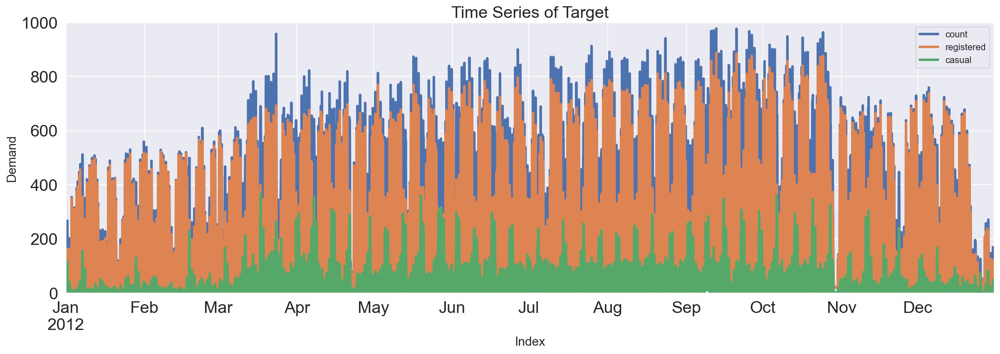

In [15]:
raw_all[['count', 'registered', 'casual']].plot(kind='line', figsize=(20, 6), lw=3, fontsize=20,
                                                xlim=('2012-01-01', '2012-12-31'), ylim=(0, 1000))
plt.title('Time Series of Target', fontsize=20)
plt.xlabel('Index', fontsize=15)
plt.ylabel('Demand', fontsize=15)
plt.legend(loc='best')
plt.show()

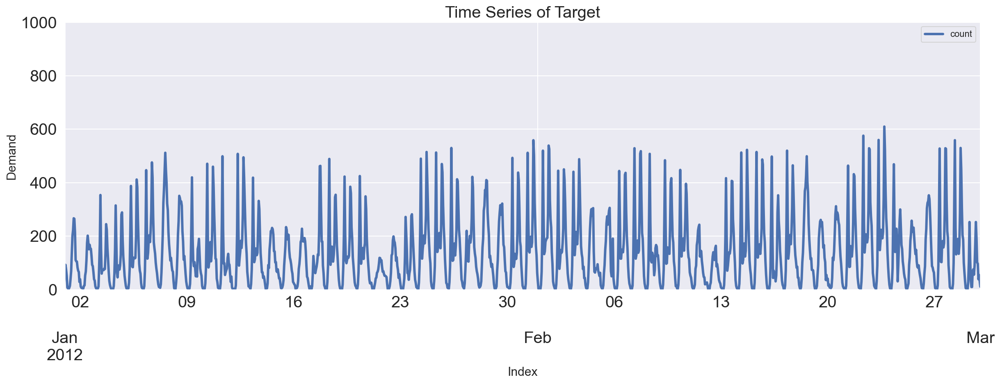

In [16]:
# count 칼럼에 뭔가 계절성 느낌이 드러남.
raw_all[['count']].plot(kind='line', figsize=(20, 6), lw=3, fontsize=20,
                        xlim=('2012-01-01', '2012-03-01'), ylim=(0, 1000))
plt.title('Time Series of Target', fontsize=20)
plt.xlabel('Index', fontsize=15)
plt.ylabel('Demand', fontsize=15)
plt.legend(loc='best')
plt.show()

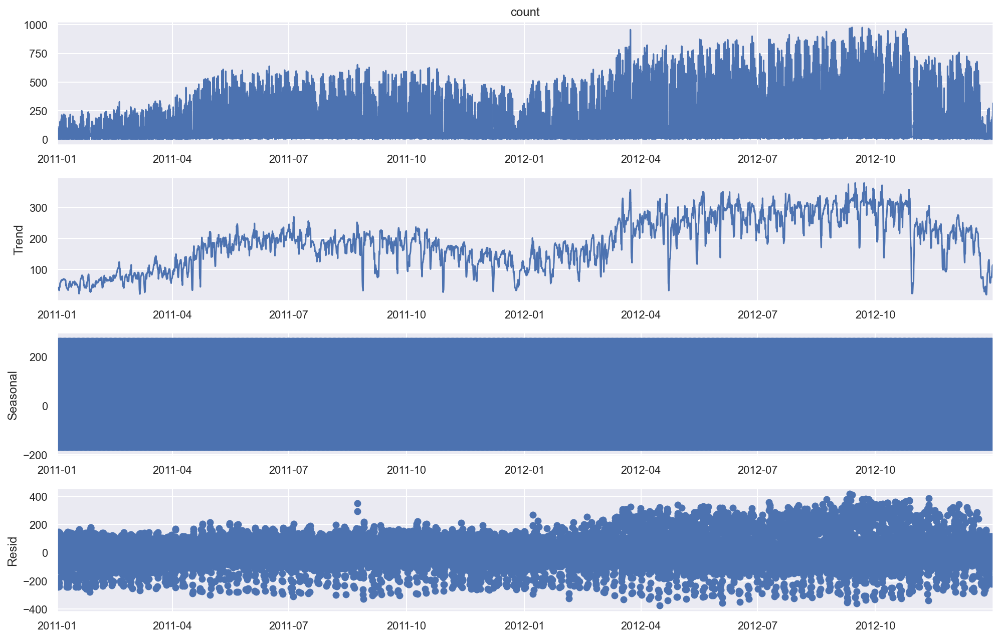

In [17]:
# split data as trend + seasonal + residual

# Moving Average 방식으로 계절성을 분해하는 메서드
# additive = trend와 seasonal과 residual이 선형결합으로 이루어져 있을 것이라는 가정
plt.rcParams['figure.figsize'] = (14, 9)
sm.tsa.seasonal_decompose(raw_all['count'], model='additive').plot()
plt.show()

- additive 모델

In [18]:
result = sm.tsa.seasonal_decompose(raw_all['count'], model='additive')

- observed
- trend
- seasonal
- resid

In [19]:
# result.observed
# result.seasonal
result.resid

DateTime
2011-01-01 00:00:00   nan
2011-01-01 01:00:00   nan
2011-01-01 02:00:00   nan
2011-01-01 03:00:00   nan
2011-01-01 04:00:00   nan
                       ..
2012-12-31 19:00:00   nan
2012-12-31 20:00:00   nan
2012-12-31 21:00:00   nan
2012-12-31 22:00:00   nan
2012-12-31 23:00:00   nan
Freq: H, Name: resid, Length: 17544, dtype: float64

In [20]:
# 일정 기간의 data를 사용하여 trend를 계산하므로, na가 뜨는 것.
result.trend

DateTime
2011-01-01 00:00:00   nan
2011-01-01 01:00:00   nan
2011-01-01 02:00:00   nan
2011-01-01 03:00:00   nan
2011-01-01 04:00:00   nan
                       ..
2012-12-31 19:00:00   nan
2012-12-31 20:00:00   nan
2012-12-31 21:00:00   nan
2012-12-31 22:00:00   nan
2012-12-31 23:00:00   nan
Freq: H, Name: trend, Length: 17544, dtype: float64

In [21]:
result.trend[result.trend.notna()]

DateTime
2011-01-01 12:00:00    41.06
2011-01-01 13:00:00    40.60
2011-01-01 14:00:00    39.65
2011-01-01 15:00:00    39.02
2011-01-01 16:00:00    38.92
                       ...  
2012-12-31 07:00:00   109.81
2012-12-31 08:00:00   110.52
2012-12-31 09:00:00   111.77
2012-12-31 10:00:00   113.19
2012-12-31 11:00:00   113.71
Freq: H, Name: trend, Length: 17520, dtype: float64

In [22]:
result.resid[result.resid.notna()]

DateTime
2011-01-01 12:00:00   -21.58
2011-01-01 13:00:00   -11.82
2011-01-01 14:00:00    13.90
2011-01-01 15:00:00     8.34
2011-01-01 16:00:00   -69.75
                       ...  
2012-12-31 07:00:00   -48.12
2012-12-31 08:00:00   -84.16
2012-12-31 09:00:00    14.72
2012-12-31 10:00:00    21.79
2012-12-31 11:00:00    23.97
Freq: H, Name: resid, Length: 17520, dtype: float64

In [23]:
# resid와 직접 연산한 식의 값은 같음.
(result.resid == (result.observed - result.trend - result.seasonal)).sum()

17520

In [24]:
# 잔차의 통계량 확인
pd.DataFrame(result.resid).describe()

,resid
count,"17,520.00"
mean,-0.01
std,99.68
min,-377.73
25%,-61.00
50%,-6.01
75%,54.86
max,418.44


- multiplicative 가정

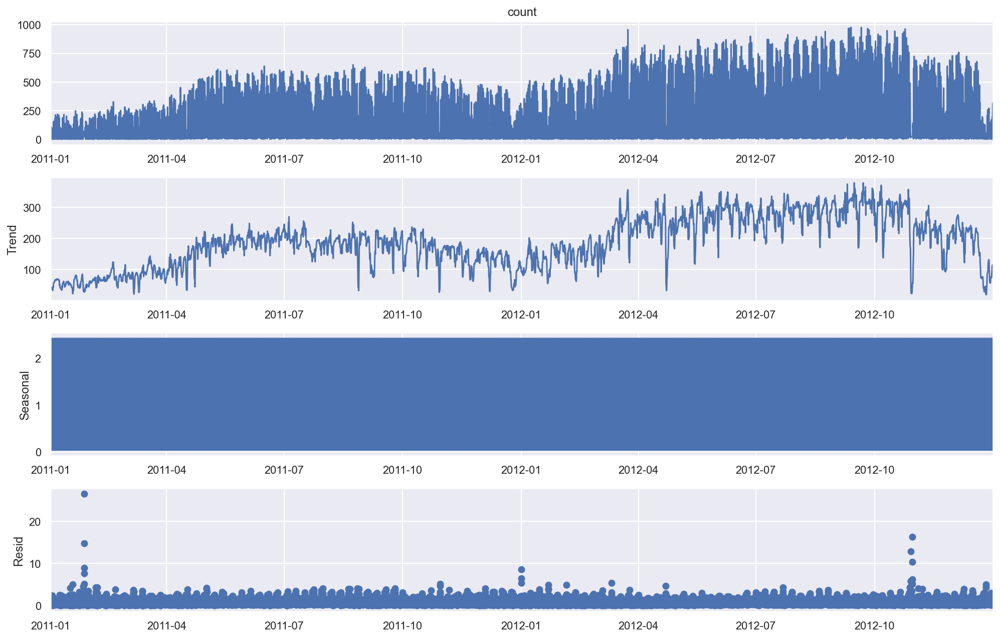

In [25]:
# split data as trend * seasonal * residual
# 주로, y(target)이 퍼센트인 경우.
sm.tsa.seasonal_decompose(raw_all['count'], model='multiplicative').plot()
plt.show()

- model 파라미터는 본인이 domain 특성 고려해서 선택해야 함.

In [26]:
# fill nan as some values of data
result = sm.tsa.seasonal_decompose(raw_all['count'], model='additive')

y_trend = pd.DataFrame(result.trend)
y_trend.fillna(method='ffill', inplace=True)
y_trend.fillna(method='bfill', inplace=True)
y_trend.columns = ['count_trend']

y_seasonal = pd.DataFrame(result.seasonal)
y_seasonal.fillna(method='ffill', inplace=True)
y_seasonal.fillna(method='bfill', inplace=True)
y_seasonal.columns = ['count_seasonal']

# merging several columns
raw_all = pd.concat([raw_all, y_trend, y_seasonal], axis=1)
raw_all

,datetime,season,holiday,workingday,weather,...,casual,registered,count,count_trend,count_seasonal
DateTime,,,,,,,,,,,
2011-01-01 00:00:00,2011-01-01 00:00:00,1.00,0.00,0.00,1.00,...,3.00,13.00,16.00,41.06,-134.25
2011-01-01 01:00:00,2011-01-01 01:00:00,1.00,0.00,0.00,1.00,...,8.00,32.00,40.00,41.06,-154.75
2011-01-01 02:00:00,2011-01-01 02:00:00,1.00,0.00,0.00,1.00,...,5.00,27.00,32.00,41.06,-165.27
2011-01-01 03:00:00,2011-01-01 03:00:00,1.00,0.00,0.00,1.00,...,3.00,10.00,13.00,41.06,-176.48
2011-01-01 04:00:00,2011-01-01 04:00:00,1.00,0.00,0.00,1.00,...,0.00,1.00,1.00,41.06,-181.67
...,...,...,...,...,...,...,...,...,...,...,...
2012-12-31 19:00:00,2012-12-31 19:00:00,1.00,0.00,1.00,2.00,...,11.00,108.00,119.00,113.71,122.70
2012-12-31 20:00:00,2012-12-31 20:00:00,1.00,0.00,1.00,2.00,...,8.00,81.00,89.00,113.71,37.48
2012-12-31 21:00:00,2012-12-31 21:00:00,1.00,0.00,1.00,1.00,...,7.00,83.00,90.00,113.71,-16.10


In [27]:
# plot of Moving average values using rolling function
# 주변 값들로 평균치를 계산하는 것. (MA)

# rolling 메서드 : window function임. 데이터 기준 위 24개 뽑음
raw_all['count'].rolling(24).mean()

DateTime
2011-01-01 00:00:00      nan
2011-01-01 01:00:00      nan
2011-01-01 02:00:00      nan
2011-01-01 03:00:00      nan
2011-01-01 04:00:00      nan
                       ...  
2012-12-31 19:00:00   110.17
2012-12-31 20:00:00   110.88
2012-12-31 21:00:00   112.67
2012-12-31 22:00:00   113.71
2012-12-31 23:00:00   113.71
Freq: H, Name: count, Length: 17544, dtype: float64

- 기본값 : 위에서부터 n개 잡고, 평균 냄. ( mean() )
- center = True
    - 가운데 기준으로 위 아래 2/n개 씩 잡아냄

In [28]:
raw_all['count'].rolling(24, center=True).mean()

DateTime
2011-01-01 00:00:00   nan
2011-01-01 01:00:00   nan
2011-01-01 02:00:00   nan
2011-01-01 03:00:00   nan
2011-01-01 04:00:00   nan
                       ..
2012-12-31 19:00:00   nan
2012-12-31 20:00:00   nan
2012-12-31 21:00:00   nan
2012-12-31 22:00:00   nan
2012-12-31 23:00:00   nan
Freq: H, Name: count, Length: 17544, dtype: float64

- min_periods = 
    - 최소 데이터 수 
    - min_periods = 1 이면, 1개여도 연산해줌

In [29]:
print(raw_all['count'])
raw_all['count'].rolling(24, min_periods=1).sum()

DateTime
2011-01-01 00:00:00    16.00
2011-01-01 01:00:00    40.00
2011-01-01 02:00:00    32.00
2011-01-01 03:00:00    13.00
2011-01-01 04:00:00     1.00
                       ...  
2012-12-31 19:00:00   119.00
2012-12-31 20:00:00    89.00
2012-12-31 21:00:00    90.00
2012-12-31 22:00:00    61.00
2012-12-31 23:00:00    49.00
Freq: H, Name: count, Length: 17544, dtype: float64


DateTime
2011-01-01 00:00:00      16.00
2011-01-01 01:00:00      56.00
2011-01-01 02:00:00      88.00
2011-01-01 03:00:00     101.00
2011-01-01 04:00:00     102.00
                        ...   
2012-12-31 19:00:00   2,644.00
2012-12-31 20:00:00   2,661.00
2012-12-31 21:00:00   2,704.00
2012-12-31 22:00:00   2,729.00
2012-12-31 23:00:00   2,729.00
Freq: H, Name: count, Length: 17544, dtype: float64

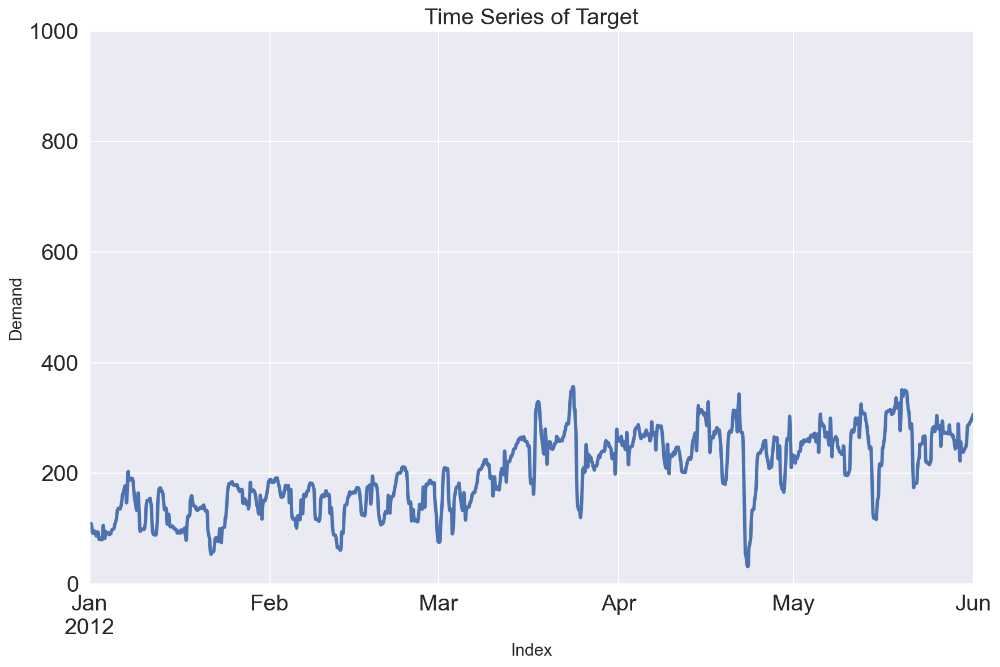

In [30]:
raw_all['count'].rolling(24).mean().plot(kind='line', lw=3, fontsize=20,
                                         xlim=('2012-01-01', '2012-06-01'), ylim=(0, 1000))
plt.title('Time Series of Target', fontsize=20)
plt.xlabel('Index', fontsize=15)
plt.ylabel('Demand', fontsize=15)
plt.show()

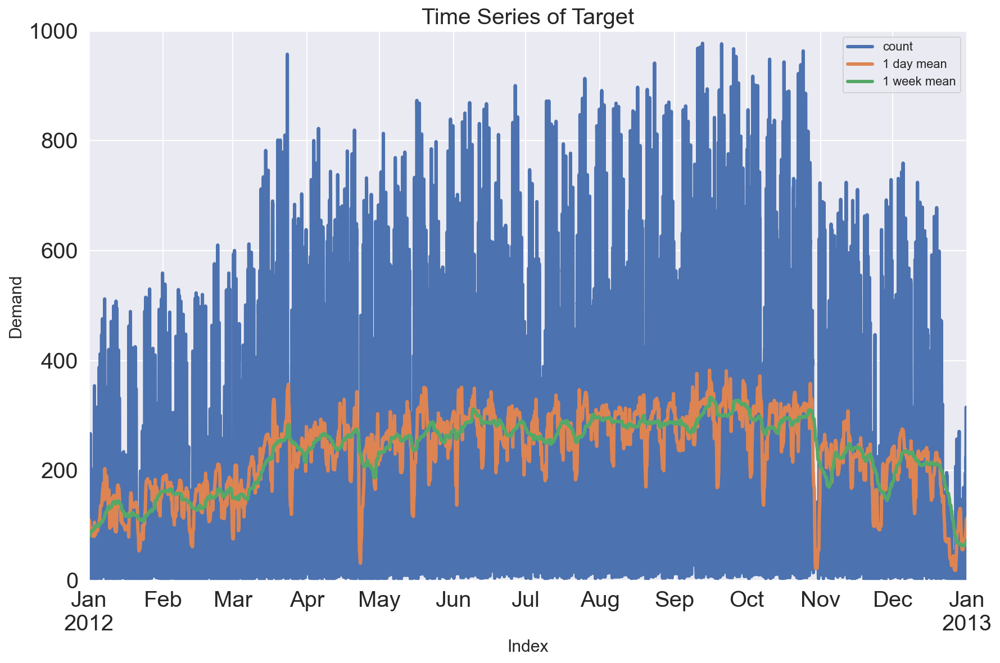

In [31]:
# comparison of several moving average values
pd.concat([raw_all['count'],
           raw_all['count'].rolling(24).mean(),  # freq이 H이므로 24는 24시간 즉 1일
           raw_all['count'].rolling(24*7).mean()], axis=1).plot(kind='line', lw=3, fontsize=20,
                                                                xlim=(
                                                                    '2012-01-01', '2013-01-01'),
                                                                ylim=(0, 1000))
plt.title('Time Series of Target', fontsize=20)
plt.xlabel('Index', fontsize=15)
plt.ylabel('Demand', fontsize=15)
plt.legend(labels=['count', '1 day mean', '1 week mean'])
plt.show()

In [32]:
y_count_day = raw_all['count'].rolling(24).mean()
y_count_day.fillna(method='ffill', inplace=True)
y_count_day.fillna(method='bfill', inplace=True)
y_count_day.name = 'count_day'
y_count_week = raw_all['count'].rolling(24*7).mean()
y_count_week.fillna(method='ffill', inplace=True)
y_count_week.fillna(method='bfill', inplace=True)
y_count_week.name = 'count_week'

In [33]:
raw_all = pd.concat([raw_all, y_count_day, y_count_week], axis=1)
raw_all

,datetime,season,holiday,workingday,weather,...,count,count_trend,count_seasonal,count_day,count_week
DateTime,,,,,,,,,,,
2011-01-01 00:00:00,2011-01-01 00:00:00,1.00,0.00,0.00,1.00,...,16.00,41.06,-134.25,41.04,56.11
2011-01-01 01:00:00,2011-01-01 01:00:00,1.00,0.00,0.00,1.00,...,40.00,41.06,-154.75,41.04,56.11
2011-01-01 02:00:00,2011-01-01 02:00:00,1.00,0.00,0.00,1.00,...,32.00,41.06,-165.27,41.04,56.11
2011-01-01 03:00:00,2011-01-01 03:00:00,1.00,0.00,0.00,1.00,...,13.00,41.06,-176.48,41.04,56.11
2011-01-01 04:00:00,2011-01-01 04:00:00,1.00,0.00,0.00,1.00,...,1.00,41.06,-181.67,41.04,56.11
...,...,...,...,...,...,...,...,...,...,...,...
2012-12-31 19:00:00,2012-12-31 19:00:00,1.00,0.00,1.00,2.00,...,119.00,113.71,122.70,110.17,73.30
2012-12-31 20:00:00,2012-12-31 20:00:00,1.00,0.00,1.00,2.00,...,89.00,113.71,37.48,110.88,73.70
2012-12-31 21:00:00,2012-12-31 21:00:00,1.00,0.00,1.00,1.00,...,90.00,113.71,-16.10,112.67,74.10


- count_trend는 hourly 데이터
- count_day와 count_week와 비교하면 값이 살짝 달라지긴 함

- 시간(index)에 따른 수요(count_trend)의 차이를 알고 싶다면?
- diff() 메서드

In [34]:
pd.concat([raw_all[['count']], raw_all[['count']].diff()], axis=1)

,count,count
DateTime,,
2011-01-01 00:00:00,16.00,nan
2011-01-01 01:00:00,40.00,24.00
2011-01-01 02:00:00,32.00,-8.00
2011-01-01 03:00:00,13.00,-19.00
2011-01-01 04:00:00,1.00,-12.00
...,...,...
2012-12-31 19:00:00,119.00,-3.00
2012-12-31 20:00:00,89.00,-30.00
2012-12-31 21:00:00,90.00,1.00


- diff()는 t=n 에서 t=n-1을 빼주는 것

- 이를 통해 y의 증감폭을 알 수 있음.

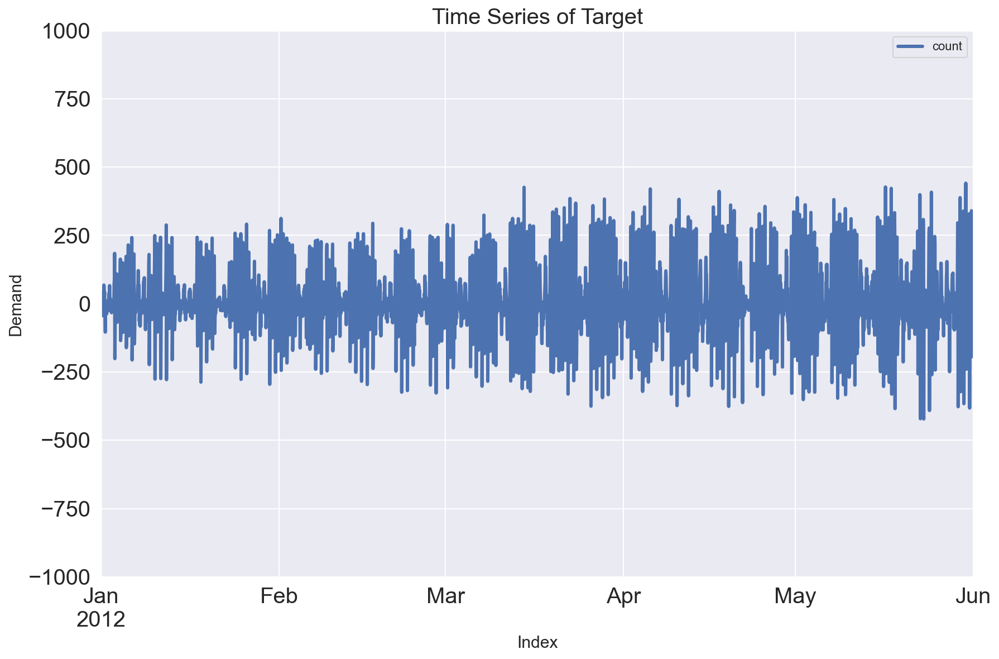

In [35]:
raw_all[['count']].diff().plot(kind='line', lw=3, fontsize=20,
                               xlim=('2012-01-01', '2012-06-01'), ylim=(-1000, 1000))
plt.title('Time Series of Target', fontsize=20)
plt.xlabel('Index', fontsize=15)
plt.ylabel('Demand', fontsize=15)
plt.show()

In [36]:
y_diff = raw_all['count'].diff()
y_diff.fillna(method='ffill', inplace=True)
y_diff.fillna(method='bfill', inplace=True)
y_diff.name = 'count_diff'

In [37]:
raw_all = pd.concat([raw_all, y_diff], axis=1)
raw_all

,datetime,season,holiday,workingday,weather,...,count_trend,count_seasonal,count_day,count_week,count_diff
DateTime,,,,,,,,,,,
2011-01-01 00:00:00,2011-01-01 00:00:00,1.00,0.00,0.00,1.00,...,41.06,-134.25,41.04,56.11,24.00
2011-01-01 01:00:00,2011-01-01 01:00:00,1.00,0.00,0.00,1.00,...,41.06,-154.75,41.04,56.11,24.00
2011-01-01 02:00:00,2011-01-01 02:00:00,1.00,0.00,0.00,1.00,...,41.06,-165.27,41.04,56.11,-8.00
2011-01-01 03:00:00,2011-01-01 03:00:00,1.00,0.00,0.00,1.00,...,41.06,-176.48,41.04,56.11,-19.00
2011-01-01 04:00:00,2011-01-01 04:00:00,1.00,0.00,0.00,1.00,...,41.06,-181.67,41.04,56.11,-12.00
...,...,...,...,...,...,...,...,...,...,...,...
2012-12-31 19:00:00,2012-12-31 19:00:00,1.00,0.00,1.00,2.00,...,113.71,122.70,110.17,73.30,-3.00
2012-12-31 20:00:00,2012-12-31 20:00:00,1.00,0.00,1.00,2.00,...,113.71,37.48,110.88,73.70,-30.00
2012-12-31 21:00:00,2012-12-31 21:00:00,1.00,0.00,1.00,1.00,...,113.71,-16.10,112.67,74.10,1.00


In [38]:
raw_all[['temp']].ndim

2

In [39]:
# split values as some group
raw_all[['temp_group']] = pd.cut(raw_all['temp'], 10)
raw_all

,datetime,season,holiday,workingday,weather,...,count_seasonal,count_day,count_week,count_diff,temp_group
DateTime,,,,,,,,,,,
2011-01-01 00:00:00,2011-01-01 00:00:00,1.00,0.00,0.00,1.00,...,-134.25,41.04,56.11,24.00,"(8.856, 12.874]"
2011-01-01 01:00:00,2011-01-01 01:00:00,1.00,0.00,0.00,1.00,...,-154.75,41.04,56.11,24.00,"(8.856, 12.874]"
2011-01-01 02:00:00,2011-01-01 02:00:00,1.00,0.00,0.00,1.00,...,-165.27,41.04,56.11,-8.00,"(8.856, 12.874]"
2011-01-01 03:00:00,2011-01-01 03:00:00,1.00,0.00,0.00,1.00,...,-176.48,41.04,56.11,-19.00,"(8.856, 12.874]"
2011-01-01 04:00:00,2011-01-01 04:00:00,1.00,0.00,0.00,1.00,...,-181.67,41.04,56.11,-12.00,"(8.856, 12.874]"
...,...,...,...,...,...,...,...,...,...,...,...
2012-12-31 19:00:00,2012-12-31 19:00:00,1.00,0.00,1.00,2.00,...,122.70,110.17,73.30,-3.00,"(8.856, 12.874]"
2012-12-31 20:00:00,2012-12-31 20:00:00,1.00,0.00,1.00,2.00,...,37.48,110.88,73.70,-30.00,"(8.856, 12.874]"
2012-12-31 21:00:00,2012-12-31 21:00:00,1.00,0.00,1.00,1.00,...,-16.10,112.67,74.10,1.00,"(8.856, 12.874]"


In [40]:
# 숫자화 하긴 해야 함.
raw_all['temp_group'].dtype

CategoricalDtype(categories=[(0.78, 4.838], (4.838, 8.856], (8.856, 12.874], (12.874, 16.892], (16.892, 20.91], (20.91, 24.928], (24.928, 28.946], (28.946, 32.964], (32.964, 36.982], (36.982, 41.0]],
              ordered=True)

In [41]:
# datetime 칼럼의 dt 속성의 여러 하부속성들
raw_all.datetime.dt.year
raw_all.datetime.dt.quarter

DateTime
2011-01-01 00:00:00    1
2011-01-01 01:00:00    1
2011-01-01 02:00:00    1
2011-01-01 03:00:00    1
2011-01-01 04:00:00    1
                      ..
2012-12-31 19:00:00    4
2012-12-31 20:00:00    4
2012-12-31 21:00:00    4
2012-12-31 22:00:00    4
2012-12-31 23:00:00    4
Freq: H, Name: datetime, Length: 17544, dtype: int64

In [42]:
raw_all['year'] = raw_all.datetime.dt.year
raw_all['quarter'] = raw_all.datetime.dt.quarter
raw_all

,datetime,season,holiday,workingday,weather,...,count_week,count_diff,temp_group,year,quarter
DateTime,,,,,,,,,,,
2011-01-01 00:00:00,2011-01-01 00:00:00,1.00,0.00,0.00,1.00,...,56.11,24.00,"(8.856, 12.874]",2011,1
2011-01-01 01:00:00,2011-01-01 01:00:00,1.00,0.00,0.00,1.00,...,56.11,24.00,"(8.856, 12.874]",2011,1
2011-01-01 02:00:00,2011-01-01 02:00:00,1.00,0.00,0.00,1.00,...,56.11,-8.00,"(8.856, 12.874]",2011,1
2011-01-01 03:00:00,2011-01-01 03:00:00,1.00,0.00,0.00,1.00,...,56.11,-19.00,"(8.856, 12.874]",2011,1
2011-01-01 04:00:00,2011-01-01 04:00:00,1.00,0.00,0.00,1.00,...,56.11,-12.00,"(8.856, 12.874]",2011,1
...,...,...,...,...,...,...,...,...,...,...,...
2012-12-31 19:00:00,2012-12-31 19:00:00,1.00,0.00,1.00,2.00,...,73.30,-3.00,"(8.856, 12.874]",2012,4
2012-12-31 20:00:00,2012-12-31 20:00:00,1.00,0.00,1.00,2.00,...,73.70,-30.00,"(8.856, 12.874]",2012,4
2012-12-31 21:00:00,2012-12-31 21:00:00,1.00,0.00,1.00,1.00,...,74.10,1.00,"(8.856, 12.874]",2012,4


In [43]:
# 2011 : 1~4, 2012: 5~8
raw_all['quarter_ver2'] = raw_all.quarter + \
    (raw_all.year - raw_all.year.min()) * 4
raw_all

,datetime,season,holiday,workingday,weather,...,count_diff,temp_group,year,quarter,quarter_ver2
DateTime,,,,,,,,,,,
2011-01-01 00:00:00,2011-01-01 00:00:00,1.00,0.00,0.00,1.00,...,24.00,"(8.856, 12.874]",2011,1,1
2011-01-01 01:00:00,2011-01-01 01:00:00,1.00,0.00,0.00,1.00,...,24.00,"(8.856, 12.874]",2011,1,1
2011-01-01 02:00:00,2011-01-01 02:00:00,1.00,0.00,0.00,1.00,...,-8.00,"(8.856, 12.874]",2011,1,1
2011-01-01 03:00:00,2011-01-01 03:00:00,1.00,0.00,0.00,1.00,...,-19.00,"(8.856, 12.874]",2011,1,1
2011-01-01 04:00:00,2011-01-01 04:00:00,1.00,0.00,0.00,1.00,...,-12.00,"(8.856, 12.874]",2011,1,1
...,...,...,...,...,...,...,...,...,...,...,...
2012-12-31 19:00:00,2012-12-31 19:00:00,1.00,0.00,1.00,2.00,...,-3.00,"(8.856, 12.874]",2012,4,8
2012-12-31 20:00:00,2012-12-31 20:00:00,1.00,0.00,1.00,2.00,...,-30.00,"(8.856, 12.874]",2012,4,8
2012-12-31 21:00:00,2012-12-31 21:00:00,1.00,0.00,1.00,1.00,...,1.00,"(8.856, 12.874]",2012,4,8


In [44]:
raw_all['month'] = raw_all.datetime.dt.month
raw_all['day'] = raw_all.datetime.dt.day
raw_all['hour'] = raw_all.datetime.dt.hour
raw_all['dayofweek'] = raw_all.datetime.dt.dayofweek  # 요일
raw_all

,datetime,season,holiday,workingday,weather,...,quarter_ver2,month,day,hour,dayofweek
DateTime,,,,,,,,,,,
2011-01-01 00:00:00,2011-01-01 00:00:00,1.00,0.00,0.00,1.00,...,1,1,1,0,5
2011-01-01 01:00:00,2011-01-01 01:00:00,1.00,0.00,0.00,1.00,...,1,1,1,1,5
2011-01-01 02:00:00,2011-01-01 02:00:00,1.00,0.00,0.00,1.00,...,1,1,1,2,5
2011-01-01 03:00:00,2011-01-01 03:00:00,1.00,0.00,0.00,1.00,...,1,1,1,3,5
2011-01-01 04:00:00,2011-01-01 04:00:00,1.00,0.00,0.00,1.00,...,1,1,1,4,5
...,...,...,...,...,...,...,...,...,...,...,...
2012-12-31 19:00:00,2012-12-31 19:00:00,1.00,0.00,1.00,2.00,...,8,12,31,19,0
2012-12-31 20:00:00,2012-12-31 20:00:00,1.00,0.00,1.00,2.00,...,8,12,31,20,0
2012-12-31 21:00:00,2012-12-31 21:00:00,1.00,0.00,1.00,1.00,...,8,12,31,21,0


In [45]:
# lagged variable 생성

# sort 방향에 따라 shift(-1)일 수도 있음
raw_all['count_lag1'] = raw_all['count'].shift(1)
raw_all['count_lag2'] = raw_all['count'].shift(2)

In [46]:
# row를 아래로 밀었기 때문에 NA값 생겼음.
raw_all['count_lag1'].fillna(method='bfill', inplace=True)
raw_all['count_lag2'].fillna(method='bfill', inplace=True)

In [47]:
# 더미변수 생성
quarter_dummies = pd.get_dummies(
    raw_all.quarter, prefix='quarter_dummy', drop_first=True)
raw_all = pd.concat([raw_all, quarter_dummies], axis=1)
raw_all = raw_all.drop(['quarter'], axis=1)
raw_all

,datetime,season,holiday,workingday,weather,...,count_lag1,count_lag2,quarter_dummy_2,quarter_dummy_3,quarter_dummy_4
DateTime,,,,,,,,,,,
2011-01-01 00:00:00,2011-01-01 00:00:00,1.00,0.00,0.00,1.00,...,16.00,16.00,0,0,0
2011-01-01 01:00:00,2011-01-01 01:00:00,1.00,0.00,0.00,1.00,...,16.00,16.00,0,0,0
2011-01-01 02:00:00,2011-01-01 02:00:00,1.00,0.00,0.00,1.00,...,40.00,16.00,0,0,0
2011-01-01 03:00:00,2011-01-01 03:00:00,1.00,0.00,0.00,1.00,...,32.00,40.00,0,0,0
2011-01-01 04:00:00,2011-01-01 04:00:00,1.00,0.00,0.00,1.00,...,13.00,32.00,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...
2012-12-31 19:00:00,2012-12-31 19:00:00,1.00,0.00,1.00,2.00,...,122.00,164.00,0,0,1
2012-12-31 20:00:00,2012-12-31 20:00:00,1.00,0.00,1.00,2.00,...,119.00,122.00,0,0,1
2012-12-31 21:00:00,2012-12-31 21:00:00,1.00,0.00,1.00,1.00,...,89.00,119.00,0,0,1


In [48]:
# 분석에 사용할 값은 숫자로 저장된 것만 사용할 것임.
# temp_group은 제외
raw_all.loc[:, [col for col in raw_all.columns if col != 'temp_group']]

,datetime,season,holiday,workingday,weather,...,count_lag1,count_lag2,quarter_dummy_2,quarter_dummy_3,quarter_dummy_4
DateTime,,,,,,,,,,,
2011-01-01 00:00:00,2011-01-01 00:00:00,1.00,0.00,0.00,1.00,...,16.00,16.00,0,0,0
2011-01-01 01:00:00,2011-01-01 01:00:00,1.00,0.00,0.00,1.00,...,16.00,16.00,0,0,0
2011-01-01 02:00:00,2011-01-01 02:00:00,1.00,0.00,0.00,1.00,...,40.00,16.00,0,0,0
2011-01-01 03:00:00,2011-01-01 03:00:00,1.00,0.00,0.00,1.00,...,32.00,40.00,0,0,0
2011-01-01 04:00:00,2011-01-01 04:00:00,1.00,0.00,0.00,1.00,...,13.00,32.00,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...
2012-12-31 19:00:00,2012-12-31 19:00:00,1.00,0.00,1.00,2.00,...,122.00,164.00,0,0,1
2012-12-31 20:00:00,2012-12-31 20:00:00,1.00,0.00,1.00,2.00,...,119.00,122.00,0,0,1
2012-12-31 21:00:00,2012-12-31 21:00:00,1.00,0.00,1.00,1.00,...,89.00,119.00,0,0,1


In [49]:
raw_all.columns

Index(['datetime', 'season', 'holiday', 'workingday', 'weather', 'temp',
       'atemp', 'humidity', 'windspeed', 'casual', 'registered', 'count',
       'count_trend', 'count_seasonal', 'count_day', 'count_week',
       'count_diff', 'temp_group', 'year', 'quarter_ver2', 'month', 'day',
       'hour', 'dayofweek', 'count_lag1', 'count_lag2', 'quarter_dummy_2',
       'quarter_dummy_3', 'quarter_dummy_4'],
      dtype='object')

## Code Summary

In [50]:
raw_all = pd.read_csv(link)
raw_all

,datetime,season,holiday,workingday,weather,...,humidity,windspeed,casual,registered,count
0,2011-01-01 0:00,1,0,0,1,...,81,0.00,3,13,16
1,2011-01-01 1:00,1,0,0,1,...,80,0.00,8,32,40
2,2011-01-01 2:00,1,0,0,1,...,80,0.00,5,27,32
3,2011-01-01 3:00,1,0,0,1,...,75,0.00,3,10,13
4,2011-01-01 4:00,1,0,0,1,...,75,0.00,0,1,1
...,...,...,...,...,...,...,...,...,...,...,...
17374,2012-12-31 19:00,1,0,1,2,...,60,11.00,11,108,119
17375,2012-12-31 20:00,1,0,1,2,...,60,11.00,8,81,89
17376,2012-12-31 21:00,1,0,1,1,...,60,11.00,7,83,90
17377,2012-12-31 22:00,1,0,1,1,...,56,9.00,13,48,61


In [51]:
def non_feature_engineering(raw):
    raw_nfe = raw.copy()
    raw_nfe['datetime'] = pd.to_datetime(raw.datetime)
    raw_nfe['DateTime'] = pd.to_datetime(raw.datetime)

    raw_nfe.set_index(['DateTime'], inplace=True)
    raw_nfe = raw_nfe.asfreq('H').fillna(method='ffill')
    return raw_nfe


def feature_engineering(raw):
    raw_fe = raw.copy()
    raw_fe['datetime'] = pd.to_datetime(raw_fe.datetime)
    raw_fe['DateTime'] = pd.to_datetime(raw_fe.datetime)

    raw_fe.set_index(['DateTime'], inplace=True)
    raw_fe = raw_fe.asfreq('H').fillna(method='ffill')

    result = sm.tsa.seasonal_decompose(raw_fe['count'], model='additive')
    trend = result.trend
    trend.fillna(method='ffill', inplace=True)
    trend.fillna(method='bfill', inplace=True)
    seasonal = result.seasonal
    seasonal.fillna(method='ffill', inplace=True)
    seasonal.fillna(method='bfill', inplace=True)
    raw_fe['count_trend'] = trend
    raw_fe['count_seasonal'] = seasonal

    cd = raw_fe['count'].rolling(24).mean().fillna(method='ffill')
    cd.fillna(method='bfill', inplace=True)
    cw = raw_fe['count'].rolling(24*7).mean().fillna(method='ffill')
    cw.fillna(method='bfill', inplace=True)
    raw_fe['count_day'] = cd
    raw_fe['count_week'] = cw

    dff = raw_fe['count'].diff()
    dff.fillna(method='ffill', inplace=True)
    dff.fillna(method='bfill', inplace=True)
    raw_fe['count_diff'] = dff

    raw_fe['temp_group'] = pd.cut(raw_fe['temp'], 10)

    raw_fe['year'] = raw_fe.datetime.dt.year
    raw_fe['quarter'] = raw_fe.datetime.dt.quarter
    raw_fe['quarter_ver2'] = raw_fe.quarter + \
        (raw_fe.year - raw_fe.year.min()) * 4
    raw_fe['month'] = raw_fe.datetime.dt.month
    raw_fe['day'] = raw_fe.datetime.dt.day
    raw_fe['hour'] = raw_fe.datetime.dt.hour
    raw_fe['dayofweek'] = raw_fe.datetime.dt.dayofweek

    raw_fe['count_lag1'] = raw_fe['count'].shift(1).fillna(method='bfill')
    raw_fe['count_lag2'] = raw_fe['count'].shift(2).fillna(method='bfill')

    raw_fe = pd.concat([raw_fe, pd.get_dummies(
        raw_fe['quarter'], prefix='quarter_dummy', drop_first=True)], axis=1)
   # raw_fe.drop('quarter', axis=1, inplace=True)

    return raw_fe

In [52]:
raw_nfe = non_feature_engineering(raw_all)
raw_fe = feature_engineering(raw_all)

# Data Understanding

In [53]:
raw_fe.describe(include='all').T

,count,unique,top,freq,first,...,min,25%,50%,75%,max
datetime,17544,17379,2012-10-29 00:00:00,37,2011-01-01,...,NaN,NaN,NaN,NaN,NaN
season,"17,544.00",NaN,NaN,NaN,NaT,...,1.00,2.00,3.00,3.00,4.00
holiday,"17,544.00",NaN,NaN,NaN,NaT,...,0.00,0.00,0.00,0.00,1.00
workingday,"17,544.00",NaN,NaN,NaN,NaT,...,0.00,0.00,1.00,1.00,1.00
weather,"17,544.00",NaN,NaN,NaN,NaT,...,1.00,1.00,1.00,2.00,4.00
...,...,...,...,...,...,...,...,...,...,...,...
count_lag1,"17,544.00",NaN,NaN,NaN,NaT,...,1.00,38.00,140.00,279.00,977.00
count_lag2,"17,544.00",NaN,NaN,NaN,NaT,...,1.00,38.00,140.00,279.00,977.00
quarter_dummy_2,"17,544.00",NaN,NaN,NaN,NaT,...,0.00,0.00,0.00,0.00,1.00
quarter_dummy_3,"17,544.00",NaN,NaN,NaN,NaT,...,0.00,0.00,0.00,1.00,1.00


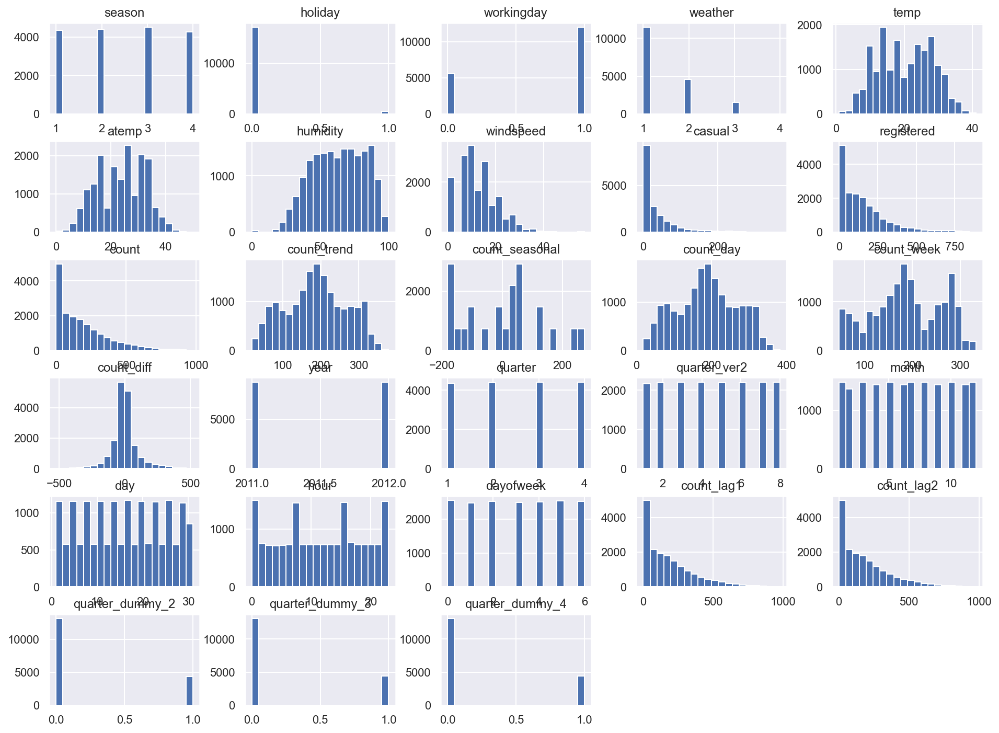

In [54]:
raw_fe.hist(bins=20, grid=True, figsize=(16,12))
plt.show()

(0.0, 1000.0)

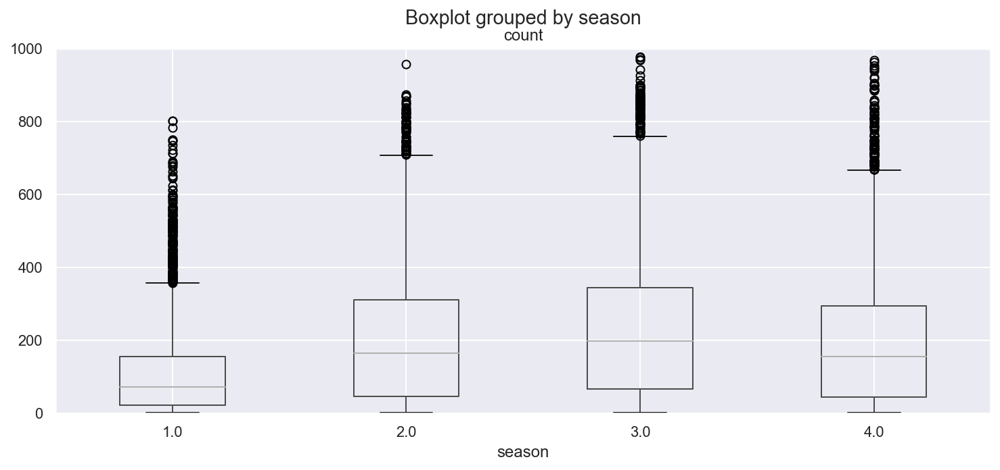

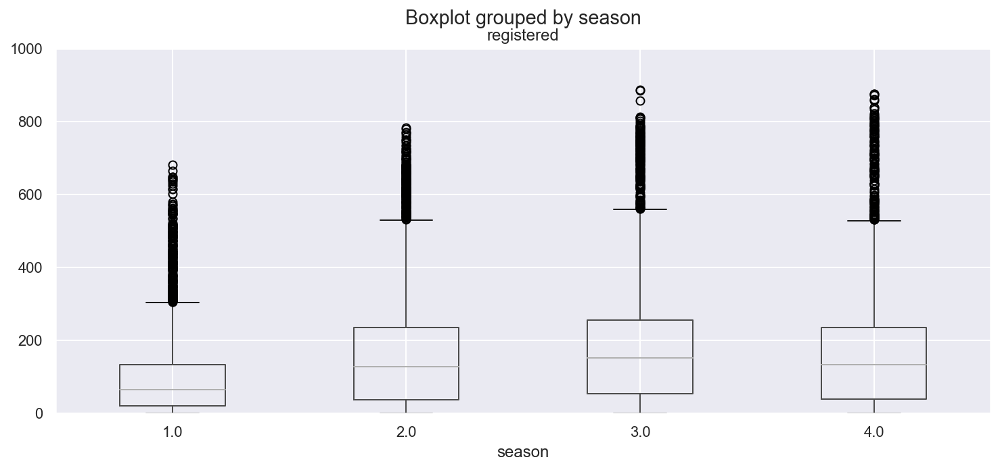

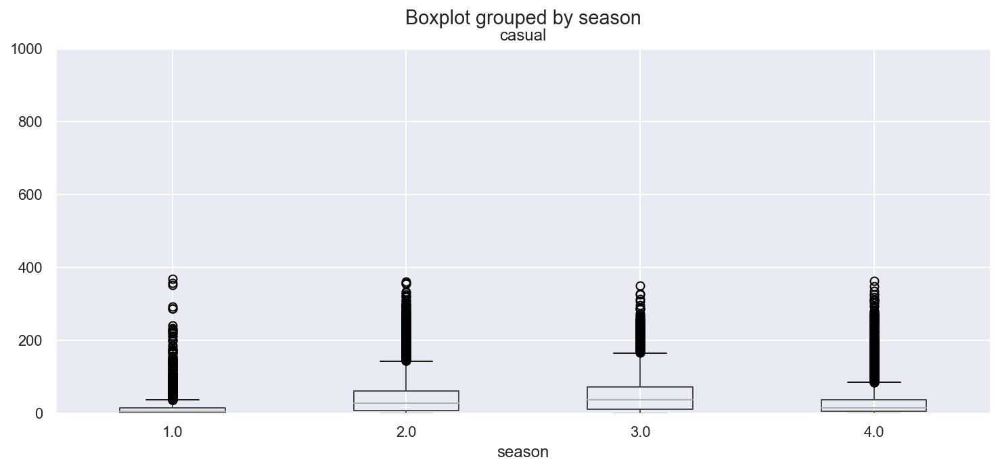

In [55]:
raw_fe.boxplot(column='count', by='season', grid=True, figsize=(12,5))
plt.ylim(0,1000)
raw_fe.boxplot(column='registered', by='season', grid=True, figsize=(12,5))
plt.ylim(0,1000)
raw_fe.boxplot(column='casual', by='season', grid=True, figsize=(12,5))
plt.ylim(0,1000)

(0.0, 1000.0)

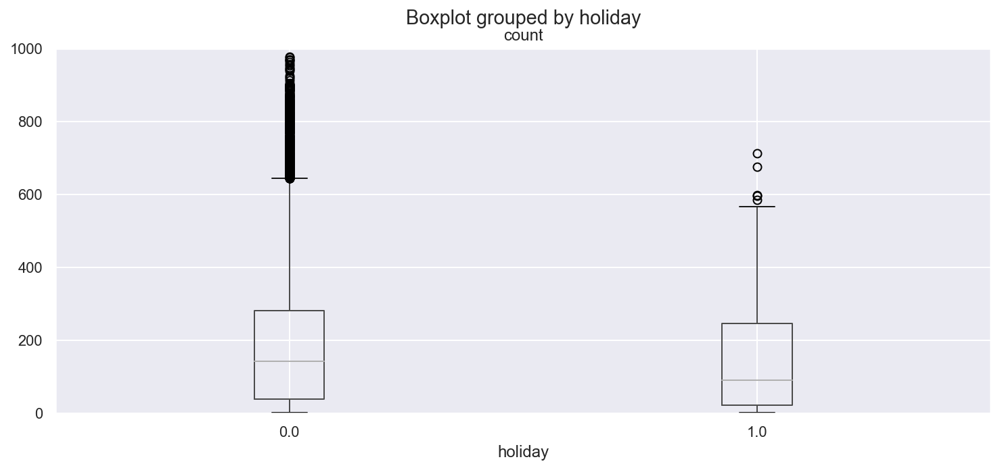

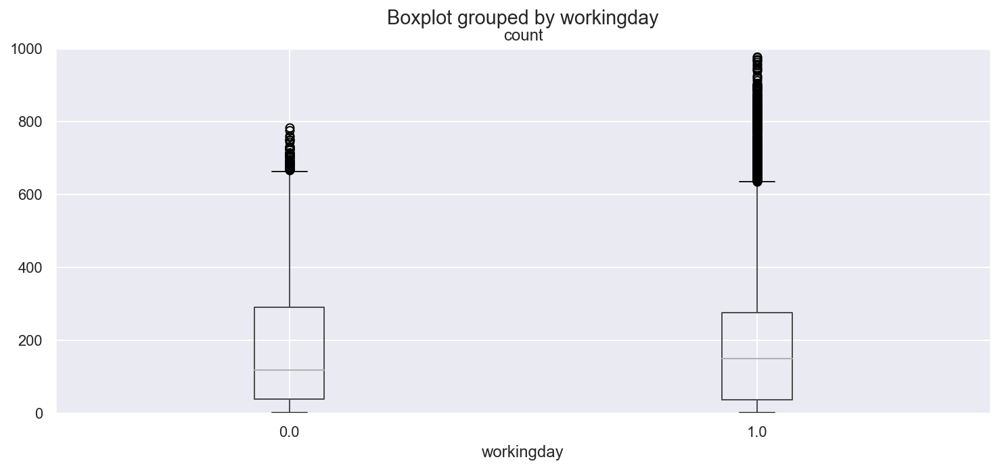

In [56]:
raw_fe.boxplot(column='count', by='holiday', grid=True, figsize=(12,5))
plt.ylim(0,1000)
raw_fe.boxplot(column='count', by='workingday', grid=True, figsize=(12,5))
plt.ylim(0,1000)

In [57]:
raw_fe[raw_fe.holiday==0]

,datetime,season,holiday,workingday,weather,...,count_lag1,count_lag2,quarter_dummy_2,quarter_dummy_3,quarter_dummy_4
DateTime,,,,,,,,,,,
2011-01-01 00:00:00,2011-01-01 00:00:00,1.00,0.00,0.00,1.00,...,16.00,16.00,0,0,0
2011-01-01 01:00:00,2011-01-01 01:00:00,1.00,0.00,0.00,1.00,...,16.00,16.00,0,0,0
2011-01-01 02:00:00,2011-01-01 02:00:00,1.00,0.00,0.00,1.00,...,40.00,16.00,0,0,0
2011-01-01 03:00:00,2011-01-01 03:00:00,1.00,0.00,0.00,1.00,...,32.00,40.00,0,0,0
2011-01-01 04:00:00,2011-01-01 04:00:00,1.00,0.00,0.00,1.00,...,13.00,32.00,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...
2012-12-31 19:00:00,2012-12-31 19:00:00,1.00,0.00,1.00,2.00,...,122.00,164.00,0,0,1
2012-12-31 20:00:00,2012-12-31 20:00:00,1.00,0.00,1.00,2.00,...,119.00,122.00,0,0,1
2012-12-31 21:00:00,2012-12-31 21:00:00,1.00,0.00,1.00,1.00,...,89.00,119.00,0,0,1


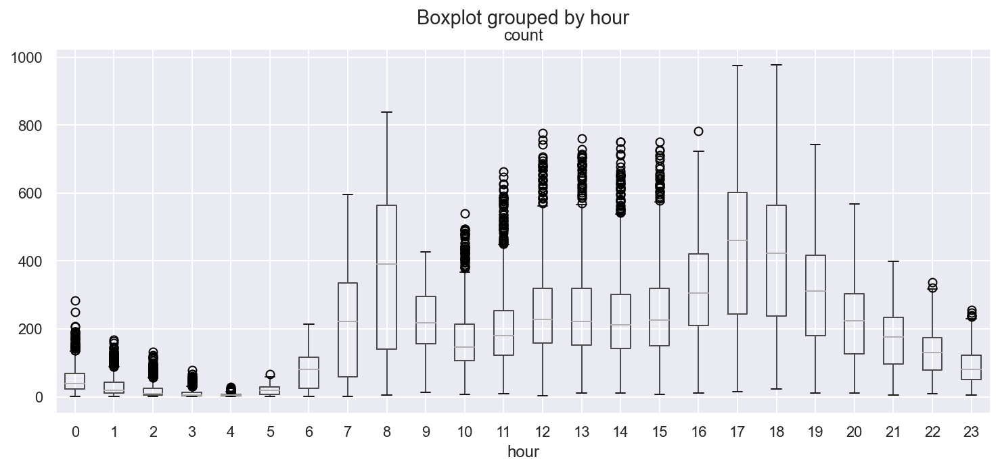

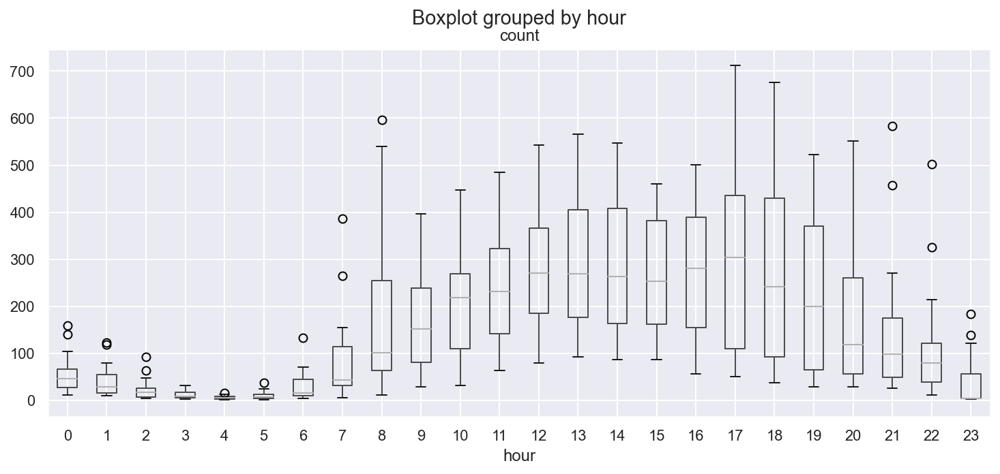

In [58]:
# box plot example
raw_fe[raw_fe.holiday == 0].boxplot(column='count', by='hour', grid=True, figsize=(12,5))
plt.show()
raw_fe[raw_fe.holiday == 1].boxplot(column='count', by='hour', grid=True, figsize=(12,5))
plt.show()

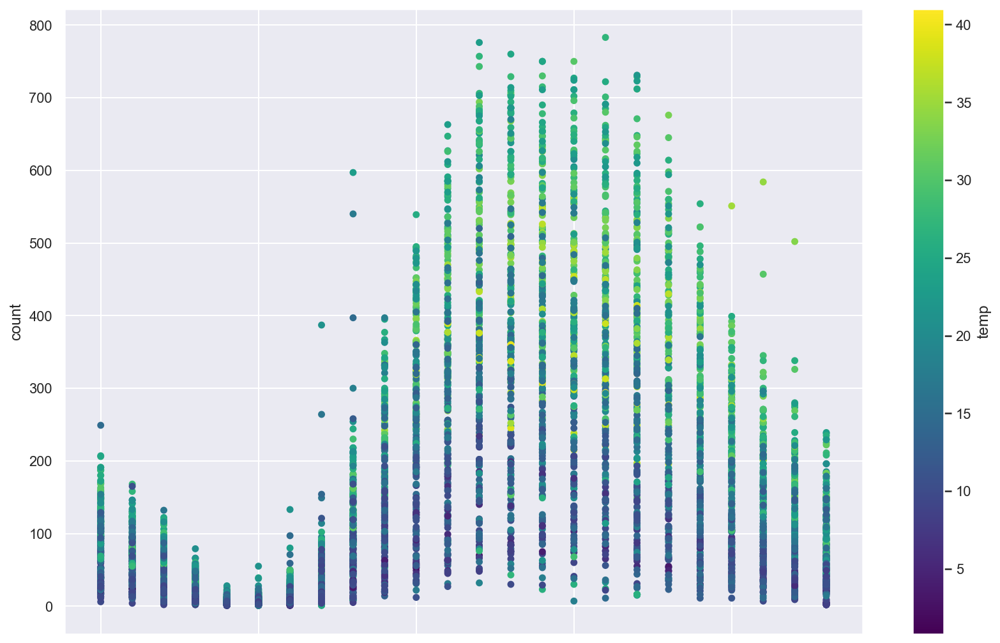

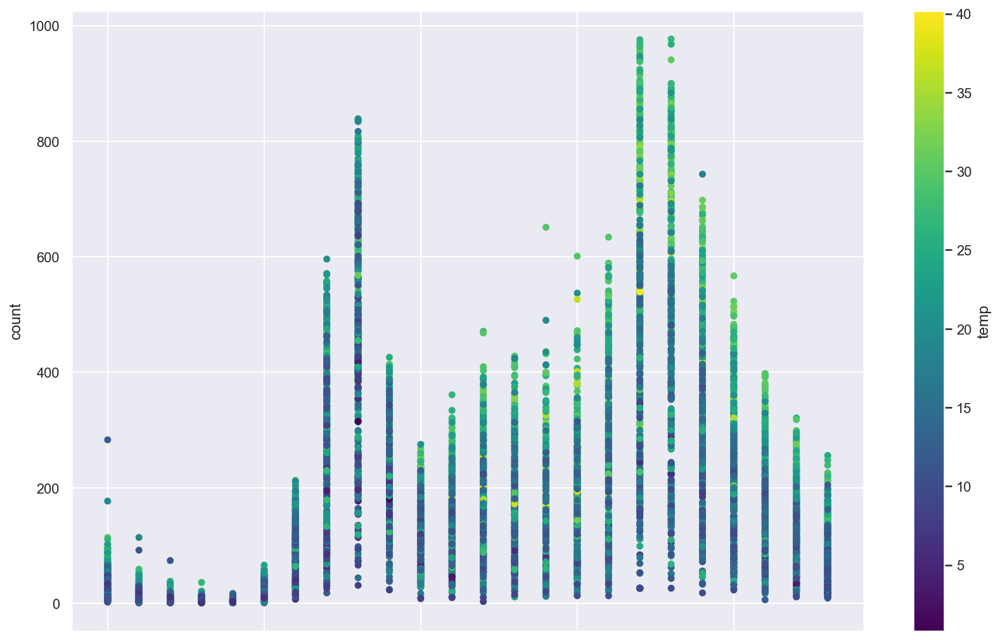

In [59]:
raw_fe[raw_fe.workingday == 0].plot(kind='scatter', y='count', x='hour', c='temp', colormap='viridis')
plt.show()
raw_fe[raw_fe.workingday == 1].plot(kind='scatter', y='count', x='hour', c='temp', colormap='viridis')
plt.show()

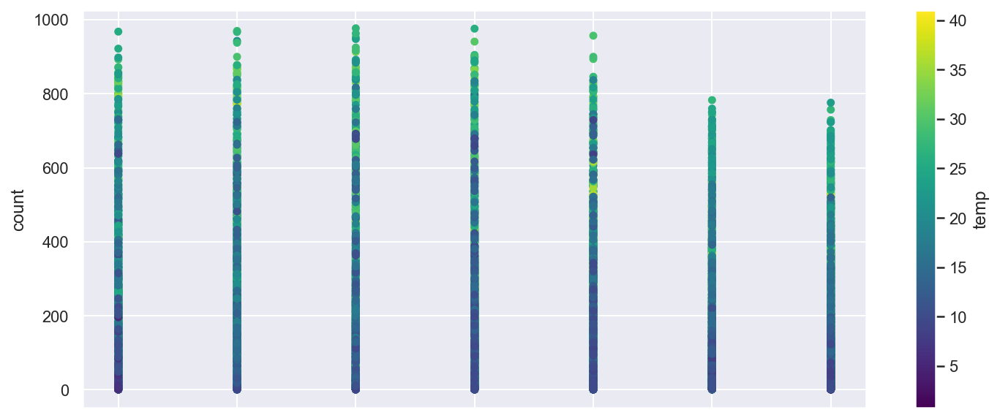

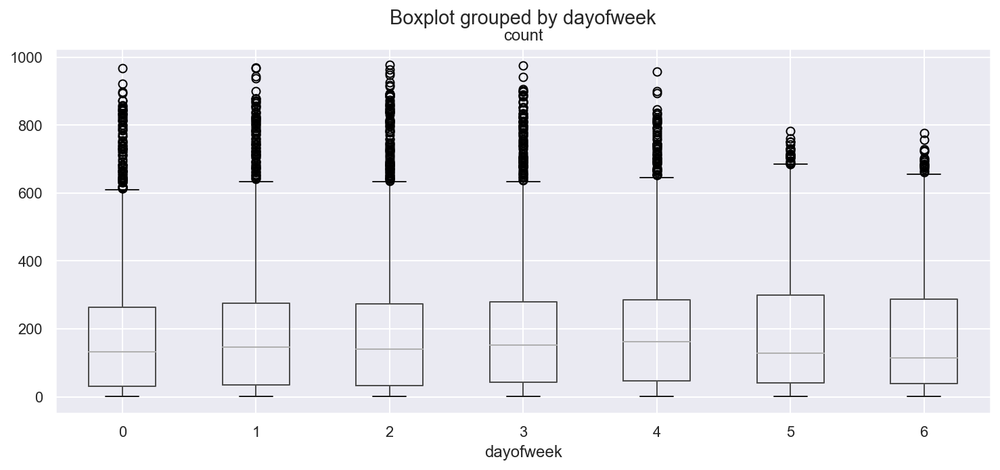

In [60]:
# scatter and box plot
raw_fe.plot.scatter(y='count', x='dayofweek', c='temp', grid=True, figsize=(12,5), colormap='viridis')
plt.show()
raw_fe.boxplot(column='count', by='dayofweek', grid=True, figsize=(12,5))
plt.show()

(0.0, 1000.0)

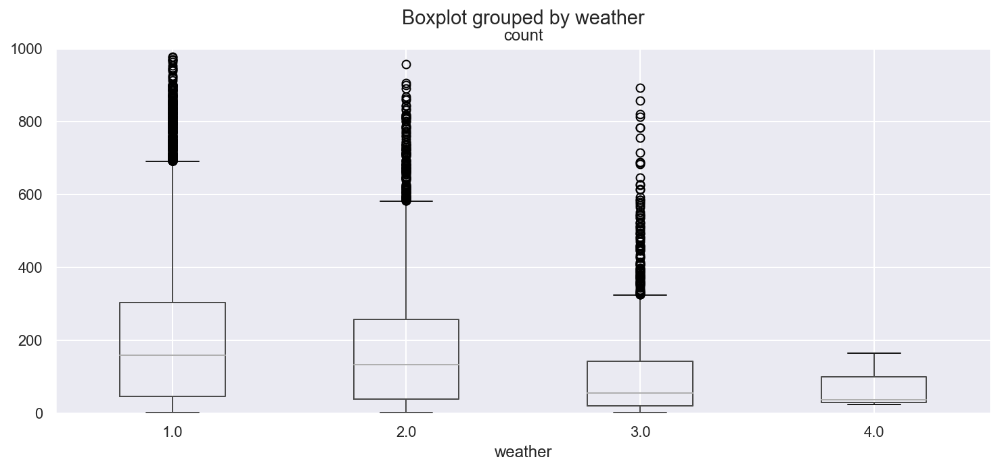

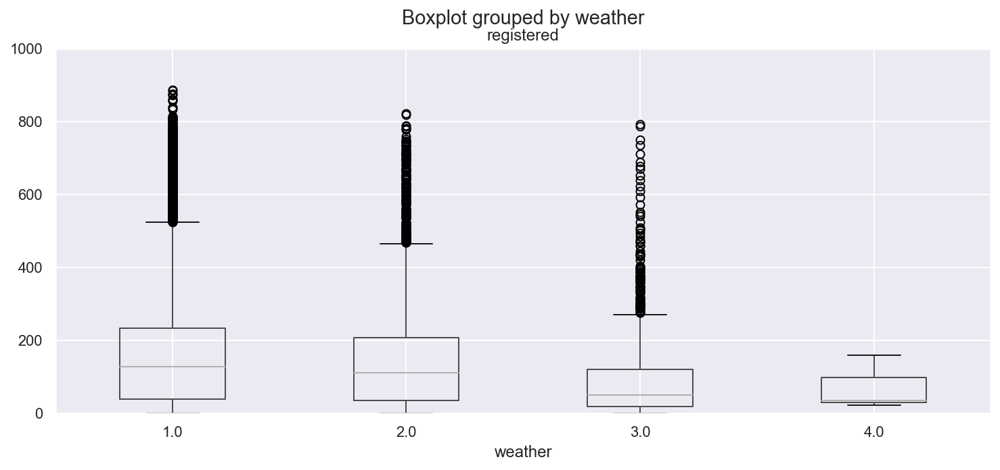

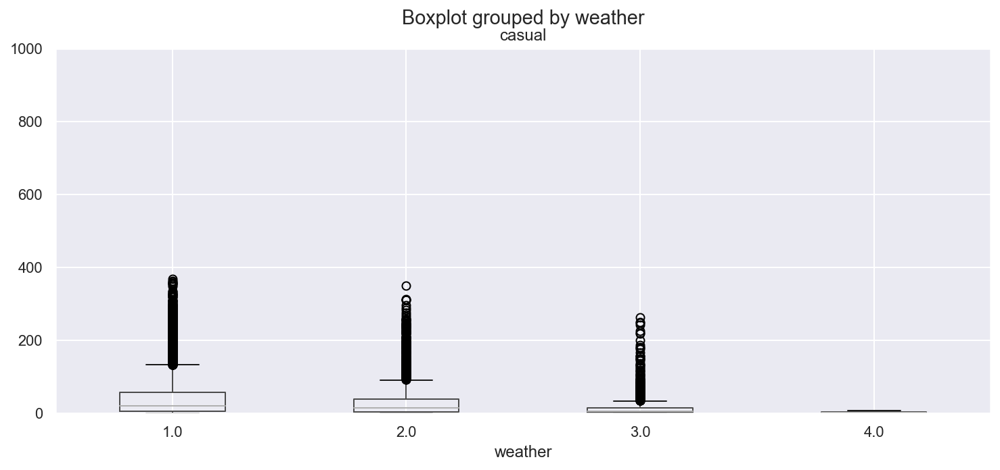

In [61]:
# box plot example
raw_fe.boxplot(column='count', by='weather', grid=True, figsize=(12,5))
plt.ylim(0,1000)
raw_fe.boxplot(column='registered', by='weather', grid=True, figsize=(12,5))
plt.ylim(0,1000)
raw_fe.boxplot(column='casual', by='weather', grid=True, figsize=(12,5))
plt.ylim(0,1000)

In [62]:
raw_fe.weather.value_counts()

1.00    11455
2.00     4563
3.00     1523
4.00        3
Name: weather, dtype: int64

In [63]:
raw_fe.weather.value_counts().sum()

17544

In [64]:
pd.DataFrame(raw_fe.weather.value_counts()/raw_fe.weather.value_counts().sum() *100)

,weather
1.00,65.29
2.00,26.01
3.00,8.68
4.00,0.02


In [65]:
pd.crosstab(index=raw_fe['count'], columns=raw_fe['weather'], margins=True)

weather,1.0,2.0,3.0,4.0,All
count,,,,,
1.0,100,45,27,0,172
2.0,136,59,37,0,232
3.0,136,66,41,0,243
4.0,149,62,36,0,247
5.0,164,63,36,0,263
...,...,...,...,...,...
968.0,1,0,0,0,1
970.0,1,0,0,0,1
976.0,1,0,0,0,1


In [66]:
sub_table = pd.crosstab(index=raw_fe['count'], columns=raw_fe['weather'], margins=True)
sub_table/sub_table.loc['All'] * 100

weather,1.0,2.0,3.0,4.0,All
count,,,,,
1.0,0.87,0.99,1.77,0.00,0.98
2.0,1.19,1.29,2.43,0.00,1.32
3.0,1.19,1.45,2.69,0.00,1.39
4.0,1.30,1.36,2.36,0.00,1.41
5.0,1.43,1.38,2.36,0.00,1.50
...,...,...,...,...,...
968.0,0.01,0.00,0.00,0.00,0.01
970.0,0.01,0.00,0.00,0.00,0.01
976.0,0.01,0.00,0.00,0.00,0.01


In [67]:
raw_fe.groupby('weather').describe().T

weather                    1.00     2.00     3.00  4.00
season          count 11,455.00 4,563.00 1,523.00  3.00
                mean       2.51     2.49     2.45  1.00
                std        1.09     1.15     1.16  0.00
                min        1.00     1.00     1.00  1.00
                25%        2.00     1.00     1.00  1.00
...                         ...      ...      ...   ...
quarter_dummy_4 min        0.00     0.00     0.00  0.00
                25%        0.00     0.00     0.00  0.00
                50%        0.00     0.00     0.00  0.00
                75%        0.00     1.00     1.00  0.00
                max        1.00     1.00     1.00  0.00

[216 rows x 4 columns]

In [68]:
raw_fe.groupby(['weather','dayofweek']).count()

datetime  season  holiday  workingday  temp  ...  \
weather dayofweek                                               ...   
1.00    0              1594    1594     1594        1594  1594  ...   
        1              1527    1527     1527        1527  1527  ...   
        2              1577    1577     1577        1577  1577  ...   
        3              1660    1660     1660        1660  1660  ...   
        4              1649    1649     1649        1649  1649  ...   
...                     ...     ...      ...         ...   ...  ...   
3.00    5               201     201      201         201   201  ...   
        6               170     170      170         170   170  ...   
4.00    0                 1       1        1           1     1  ...   
        2                 1       1        1           1     1  ...   
        5                 1       1        1           1     1  ...   

                   count_lag1  count_lag2  quarter_dummy_2  quarter_dummy_3  \
weather dayofweek                                                             
1.00    0                1594        1594             1594             1594   
        1                1527        1527             1527             1527   
        2                1577        1577             1577             1577   
        3                1660        1660             1660             1660   
        4                1649        1649             1649             1649   
...                       ...         ...              ...              ...   
3.00    5                 201         201              201              201   
        6                 170         170              170              170   
4.00    0                   1           1                1                1   
        2                   1           1                1                1   
        5                   1           1                1                1   

                   quarter_dummy_4  
weather dayofweek                   
1.00    0                     1594  
        1                     1527  
        2                     1577  
        3                     1660  
        4                     1649  
...                            ...  
3.00    5                      201  
        6                      170  
4.00    0                        1  
        2                        1  
        5                        1  

[24 rows x 28 columns]

In [69]:
raw_fe.groupby(['weather','dayofweek']).mean()

season  holiday  workingday  temp  atemp  ...  count_lag1  \
weather dayofweek                                            ...               
1.00    0            2.45     0.14        0.86 20.70  24.23  ...      188.77   
        1            2.48     0.00        1.00 21.36  24.89  ...      213.34   
        2            2.50     0.01        0.99 21.61  25.08  ...      207.08   
        3            2.53     0.03        0.97 21.35  24.88  ...      213.36   
        4            2.56     0.03        0.97 20.71  24.00  ...      203.38   
...                   ...      ...         ...   ...    ...  ...         ...   
3.00    5            2.31     0.00        0.00 17.50  20.48  ...      109.89   
        6            2.62     0.00        0.00 19.17  22.40  ...      143.89   
4.00    0            1.00     0.00        1.00  8.20  11.37  ...      152.00   
        2            1.00     0.00        1.00  9.02   9.85  ...       43.00   
        5            1.00     0.00        0.00  5.74   6.82  ...       24.00   

                   count_lag2  quarter_dummy_2  quarter_dummy_3  \
weather dayofweek                                                 
1.00    0              188.68             0.25             0.27   
        1              213.59             0.24             0.30   
        2              209.14             0.27             0.30   
        3              214.26             0.28             0.28   
        4              204.10             0.28             0.25   
...                       ...              ...              ...   
3.00    5              120.54             0.21             0.30   
        6              166.62             0.25             0.28   
4.00    0               49.00             0.00             0.00   
        2               36.00             0.00             0.00   
        5               38.00             0.00             0.00   

                   quarter_dummy_4  
weather dayofweek                   
1.00    0                     0.22  
        1                     0.20  
        2                     0.20  
        3                     0.22  
        4                     0.26  
...                            ...  
3.00    5                     0.17  
        6                     0.25  
4.00    0                     0.00  
        2                     0.00  
        5                     0.00  

[24 rows x 26 columns]

In [70]:
raw_fe.groupby(['weather','dayofweek']).agg({'count':[sum,min,max]})

count              
                         sum    min    max
weather dayofweek                         
1.00    0         303,551.00   1.00 968.00
        1         326,993.00   1.00 970.00
        2         328,285.00   1.00 977.00
        3         354,852.00   1.00 976.00
        4         333,333.00   1.00 900.00
...                      ...    ...    ...
3.00    5          19,498.00   1.00 584.00
        6          19,683.00   1.00 626.00
4.00    0             164.00 164.00 164.00
        2              36.00  36.00  36.00
        5              23.00  23.00  23.00

[24 rows x 3 columns]

In [71]:
raw_fe.groupby(['weather','dayofweek']).agg({'count':np.mean})

count
weather dayofweek       
1.00    0         190.43
        1         214.14
        2         208.17
        3         213.77
        4         202.14
...                  ...
3.00    5          97.00
        6         115.78
4.00    0         164.00
        2          36.00
        5          23.00

[24 rows x 1 columns]

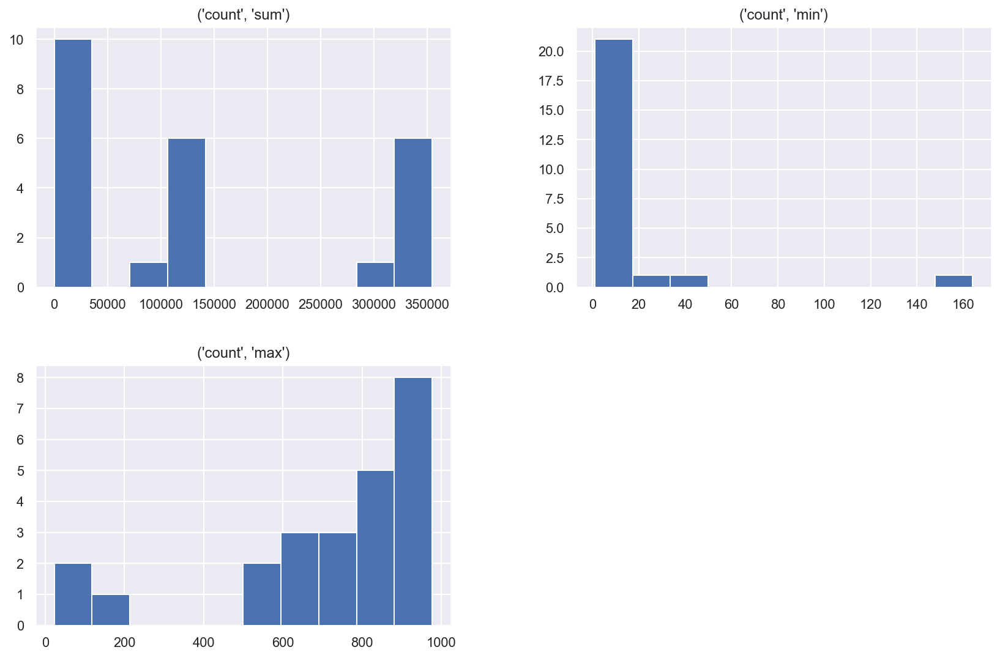

In [72]:
raw_fe.groupby(['weather','dayofweek']).agg({'count':[sum,min,max]}).hist()
plt.show()

In [73]:
raw_fe.groupby('weather').groups.keys()

dict_keys([1.0, 2.0, 3.0, 4.0])

In [74]:
raw_fe.groupby('weather').groups.items()

dict_items([(1.0, DatetimeIndex(['2011-01-01 00:00:00', '2011-01-01 01:00:00',
               '2011-01-01 02:00:00', '2011-01-01 03:00:00',
               '2011-01-01 04:00:00', '2011-01-01 06:00:00',
               '2011-01-01 07:00:00', '2011-01-01 08:00:00',
               '2011-01-01 09:00:00', '2011-01-01 10:00:00',
               ...
               '2012-12-31 02:00:00', '2012-12-31 03:00:00',
               '2012-12-31 04:00:00', '2012-12-31 05:00:00',
               '2012-12-31 06:00:00', '2012-12-31 07:00:00',
               '2012-12-31 08:00:00', '2012-12-31 21:00:00',
               '2012-12-31 22:00:00', '2012-12-31 23:00:00'],
              dtype='datetime64[ns]', name='DateTime', length=11455, freq=None)), (2.0, DatetimeIndex(['2011-01-01 05:00:00', '2011-01-01 13:00:00',
               '2011-01-01 14:00:00', '2011-01-01 15:00:00',
               '2011-01-01 16:00:00', '2011-01-01 17:00:00',
               '2011-01-01 20:00:00', '2011-01-01 21:00:00',
               '2011

In [75]:
for key, item in raw_fe.groupby('weather'):
    display(key, item)
    display(raw_fe.groupby('weather').get_group(key).head())

1.0

,datetime,season,holiday,workingday,weather,...,count_lag1,count_lag2,quarter_dummy_2,quarter_dummy_3,quarter_dummy_4
DateTime,,,,,,,,,,,
2011-01-01 00:00:00,2011-01-01 00:00:00,1.00,0.00,0.00,1.00,...,16.00,16.00,0,0,0
2011-01-01 01:00:00,2011-01-01 01:00:00,1.00,0.00,0.00,1.00,...,16.00,16.00,0,0,0
2011-01-01 02:00:00,2011-01-01 02:00:00,1.00,0.00,0.00,1.00,...,40.00,16.00,0,0,0
2011-01-01 03:00:00,2011-01-01 03:00:00,1.00,0.00,0.00,1.00,...,32.00,40.00,0,0,0
2011-01-01 04:00:00,2011-01-01 04:00:00,1.00,0.00,0.00,1.00,...,13.00,32.00,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...
2012-12-31 07:00:00,2012-12-31 07:00:00,1.00,0.00,1.00,1.00,...,40.00,9.00,0,0,1
2012-12-31 08:00:00,2012-12-31 08:00:00,1.00,0.00,1.00,1.00,...,85.00,40.00,0,0,1
2012-12-31 21:00:00,2012-12-31 21:00:00,1.00,0.00,1.00,1.00,...,89.00,119.00,0,0,1


,datetime,season,holiday,workingday,weather,...,count_lag1,count_lag2,quarter_dummy_2,quarter_dummy_3,quarter_dummy_4
DateTime,,,,,,,,,,,
2011-01-01 00:00:00,2011-01-01 00:00:00,1.00,0.00,0.00,1.00,...,16.00,16.00,0,0,0
2011-01-01 01:00:00,2011-01-01 01:00:00,1.00,0.00,0.00,1.00,...,16.00,16.00,0,0,0
2011-01-01 02:00:00,2011-01-01 02:00:00,1.00,0.00,0.00,1.00,...,40.00,16.00,0,0,0
2011-01-01 03:00:00,2011-01-01 03:00:00,1.00,0.00,0.00,1.00,...,32.00,40.00,0,0,0
2011-01-01 04:00:00,2011-01-01 04:00:00,1.00,0.00,0.00,1.00,...,13.00,32.00,0,0,0


2.0

,datetime,season,holiday,workingday,weather,...,count_lag1,count_lag2,quarter_dummy_2,quarter_dummy_3,quarter_dummy_4
DateTime,,,,,,,,,,,
2011-01-01 05:00:00,2011-01-01 05:00:00,1.00,0.00,0.00,2.00,...,1.00,13.00,0,0,0
2011-01-01 13:00:00,2011-01-01 13:00:00,1.00,0.00,0.00,2.00,...,84.00,56.00,0,0,0
2011-01-01 14:00:00,2011-01-01 14:00:00,1.00,0.00,0.00,2.00,...,94.00,84.00,0,0,0
2011-01-01 15:00:00,2011-01-01 15:00:00,1.00,0.00,0.00,2.00,...,106.00,94.00,0,0,0
2011-01-01 16:00:00,2011-01-01 16:00:00,1.00,0.00,0.00,2.00,...,110.00,106.00,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...
2012-12-31 16:00:00,2012-12-31 16:00:00,1.00,0.00,1.00,2.00,...,315.00,247.00,0,0,1
2012-12-31 17:00:00,2012-12-31 17:00:00,1.00,0.00,1.00,2.00,...,214.00,315.00,0,0,1
2012-12-31 18:00:00,2012-12-31 18:00:00,1.00,0.00,1.00,2.00,...,164.00,214.00,0,0,1


,datetime,season,holiday,workingday,weather,...,count_lag1,count_lag2,quarter_dummy_2,quarter_dummy_3,quarter_dummy_4
DateTime,,,,,,,,,,,
2011-01-01 05:00:00,2011-01-01 05:00:00,1.00,0.00,0.00,2.00,...,1.00,13.00,0,0,0
2011-01-01 13:00:00,2011-01-01 13:00:00,1.00,0.00,0.00,2.00,...,84.00,56.00,0,0,0
2011-01-01 14:00:00,2011-01-01 14:00:00,1.00,0.00,0.00,2.00,...,94.00,84.00,0,0,0
2011-01-01 15:00:00,2011-01-01 15:00:00,1.00,0.00,0.00,2.00,...,106.00,94.00,0,0,0
2011-01-01 16:00:00,2011-01-01 16:00:00,1.00,0.00,0.00,2.00,...,110.00,106.00,0,0,0


3.0

,datetime,season,holiday,workingday,weather,...,count_lag1,count_lag2,quarter_dummy_2,quarter_dummy_3,quarter_dummy_4
DateTime,,,,,,,,,,,
2011-01-01 18:00:00,2011-01-01 18:00:00,1.00,0.00,0.00,3.00,...,67.00,93.00,0,0,0
2011-01-01 19:00:00,2011-01-01 19:00:00,1.00,0.00,0.00,3.00,...,35.00,67.00,0,0,0
2011-01-02 06:00:00,2011-01-02 06:00:00,1.00,0.00,0.00,3.00,...,3.00,3.00,0,0,0
2011-01-02 08:00:00,2011-01-02 08:00:00,1.00,0.00,0.00,3.00,...,1.00,2.00,0,0,0
2011-01-02 14:00:00,2011-01-02 14:00:00,1.00,0.00,0.00,3.00,...,75.00,93.00,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...
2012-12-27 01:00:00,2012-12-27 01:00:00,1.00,0.00,1.00,3.00,...,3.00,10.00,0,0,1
2012-12-29 10:00:00,2012-12-29 10:00:00,1.00,0.00,0.00,3.00,...,49.00,44.00,0,0,1
2012-12-29 11:00:00,2012-12-29 11:00:00,1.00,0.00,0.00,3.00,...,41.00,49.00,0,0,1


,datetime,season,holiday,workingday,weather,...,count_lag1,count_lag2,quarter_dummy_2,quarter_dummy_3,quarter_dummy_4
DateTime,,,,,,,,,,,
2011-01-01 18:00:00,2011-01-01 18:00:00,1.00,0.00,0.00,3.00,...,67.00,93.00,0,0,0
2011-01-01 19:00:00,2011-01-01 19:00:00,1.00,0.00,0.00,3.00,...,35.00,67.00,0,0,0
2011-01-02 06:00:00,2011-01-02 06:00:00,1.00,0.00,0.00,3.00,...,3.00,3.00,0,0,0
2011-01-02 08:00:00,2011-01-02 08:00:00,1.00,0.00,0.00,3.00,...,1.00,2.00,0,0,0
2011-01-02 14:00:00,2011-01-02 14:00:00,1.00,0.00,0.00,3.00,...,75.00,93.00,0,0,0


4.0

,datetime,season,holiday,workingday,weather,...,count_lag1,count_lag2,quarter_dummy_2,quarter_dummy_3,quarter_dummy_4
DateTime,,,,,,,,,,,
2011-01-26 16:00:00,2011-01-26 16:00:00,1.00,0.00,1.00,4.00,...,43.00,36.00,0,0,0
2012-01-09 18:00:00,2012-01-09 18:00:00,1.00,0.00,1.00,4.00,...,152.00,49.00,0,0,0
2012-01-21 01:00:00,2012-01-21 01:00:00,1.00,0.00,0.00,4.00,...,24.00,38.00,0,0,0


,datetime,season,holiday,workingday,weather,...,count_lag1,count_lag2,quarter_dummy_2,quarter_dummy_3,quarter_dummy_4
DateTime,,,,,,,,,,,
2011-01-26 16:00:00,2011-01-26 16:00:00,1.00,0.00,1.00,4.00,...,43.00,36.00,0,0,0
2012-01-09 18:00:00,2012-01-09 18:00:00,1.00,0.00,1.00,4.00,...,152.00,49.00,0,0,0
2012-01-21 01:00:00,2012-01-21 01:00:00,1.00,0.00,0.00,4.00,...,24.00,38.00,0,0,0


In [76]:
pd.cut(raw_fe['temp'], 10).value_counts()

(24.928, 28.946]    3164
(12.874, 16.892]    2926
(20.91, 24.928]     2687
(16.892, 20.91]     2474
(8.856, 12.874]     2466
(28.946, 32.964]    1976
(4.838, 8.856]      1018
(32.964, 36.982]     625
(0.78, 4.838]        124
(36.982, 41.0]        84
Name: temp, dtype: int64

*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2-D array with a single row if you intend to specify the same RGB or RGBA value for all points.


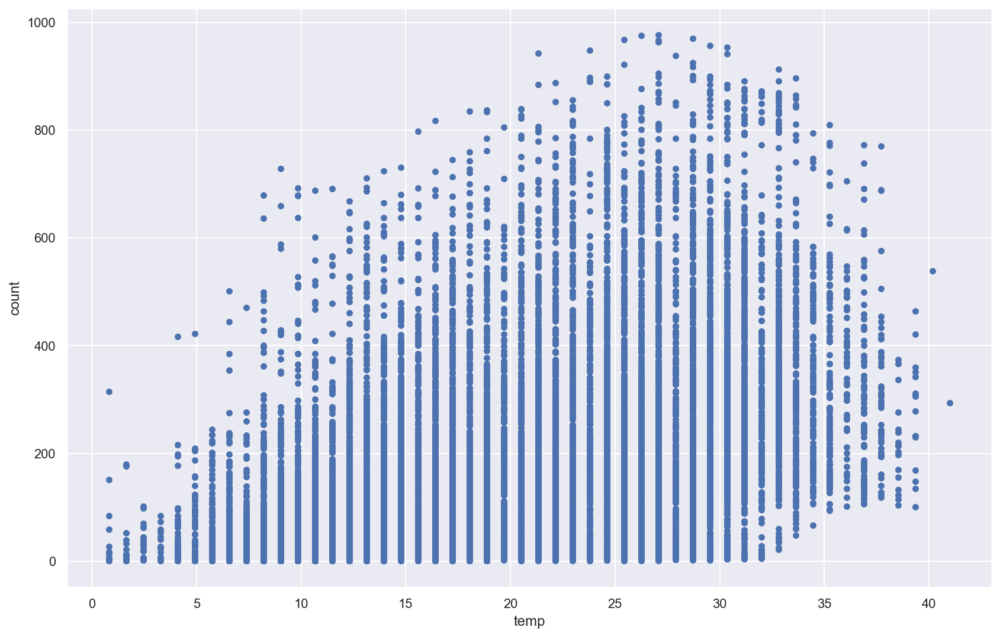

In [77]:
raw_fe.plot(kind='scatter', y='count', x='temp', grid=True)
plt.show()

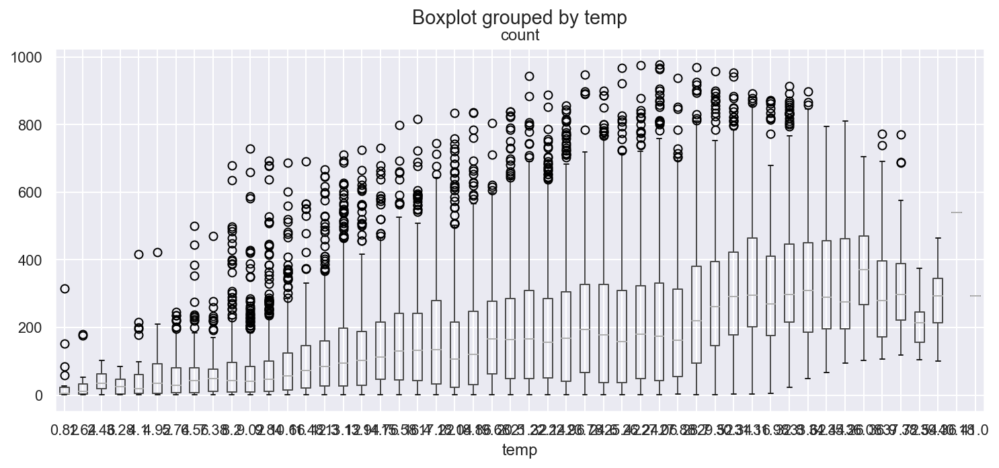

In [78]:
# box plot example
raw_fe.boxplot(column='count', by='temp', grid=True, figsize=(12,5))
plt.show()

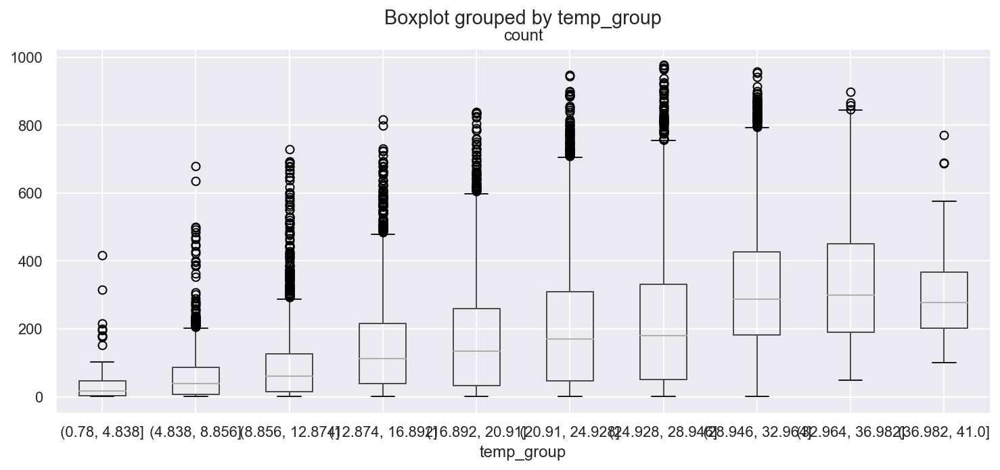

In [79]:
# box plot example
raw_fe.boxplot(column='count', by='temp_group', grid=True, figsize=(12,5))
plt.show()

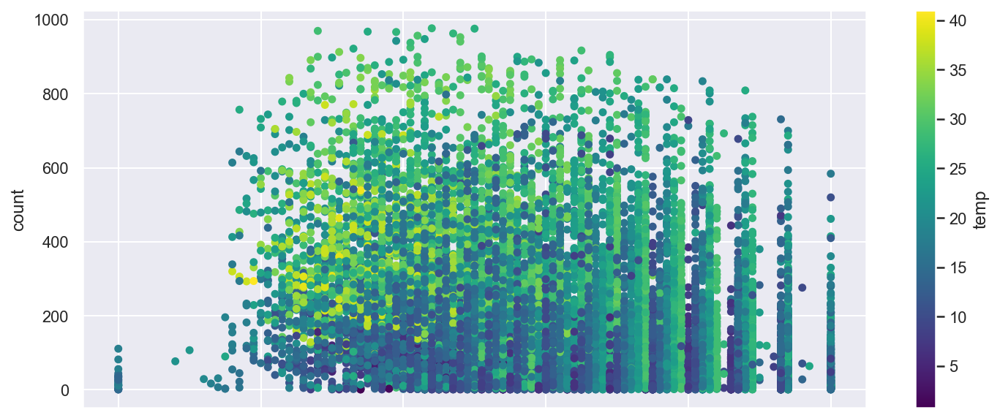

In [80]:
# scatter plot example
raw_fe.plot.scatter(y='count', x='humidity', c='temp', grid=True, figsize=(12,5), colormap='viridis')
plt.show()

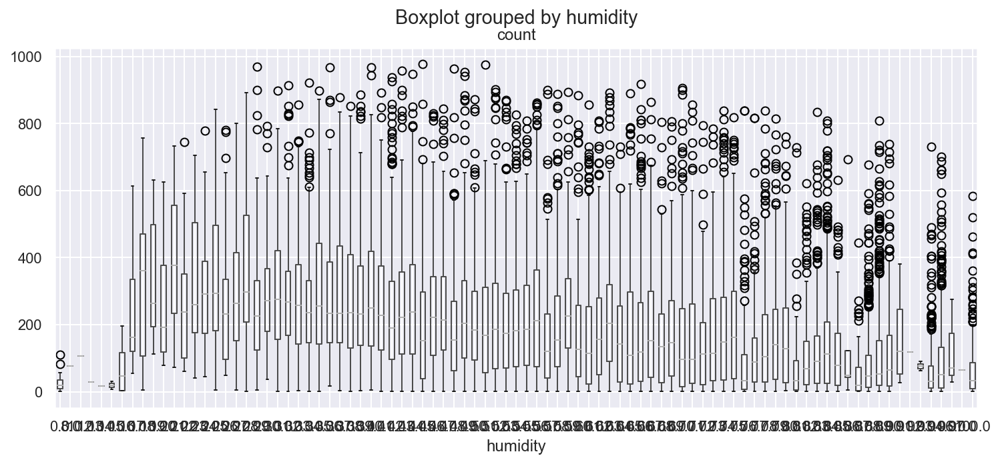

In [81]:
# box plot example
raw_fe.boxplot(column='count', by='humidity', grid=True, figsize=(12,5))
plt.show()

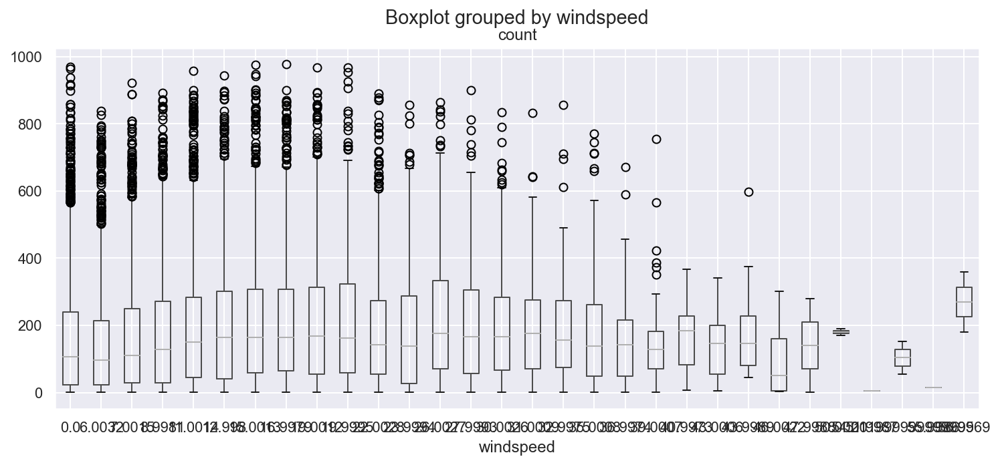

In [82]:
# box plot example
raw_fe.boxplot(column='count', by='windspeed', grid=True, figsize=(12,5))
plt.show()

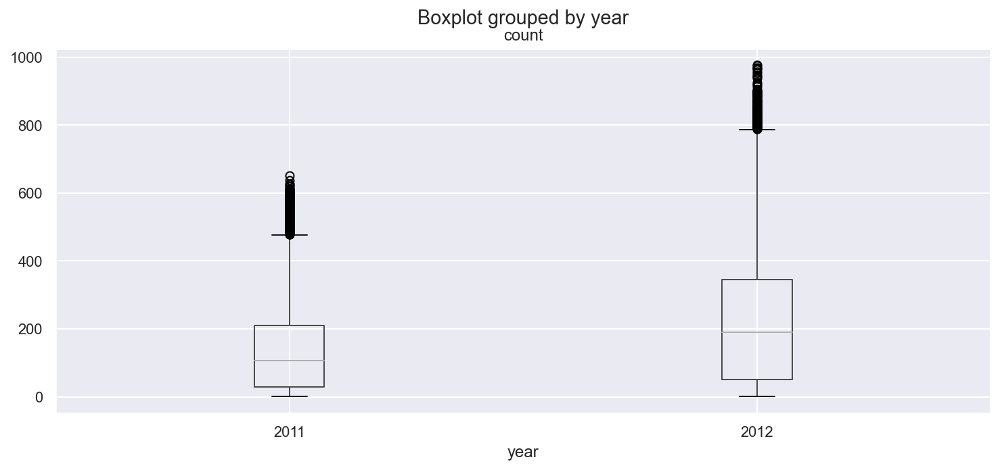

In [83]:
# box plot example
raw_fe.boxplot(column='count', by='year', grid=True, figsize=(12,5))
plt.show()

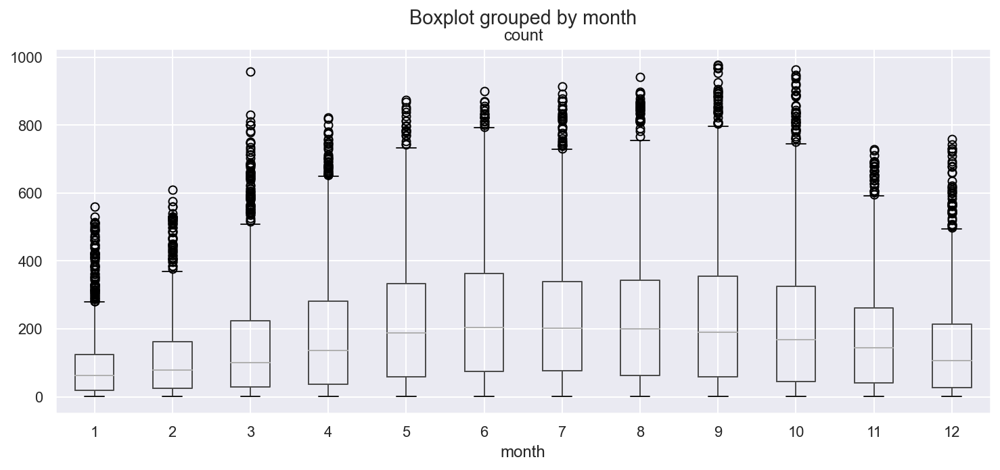

In [84]:
# box plot example
raw_fe.boxplot(column='count', by='month', grid=True, figsize=(12,5))
plt.show()

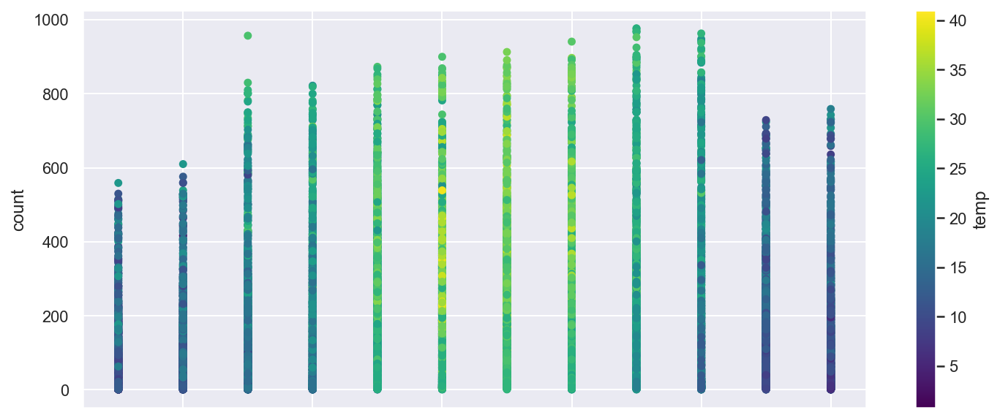

In [85]:
# scatter plot example
raw_fe.plot.scatter(y='count', x='month', c='temp', grid=True, figsize=(12,5), colormap='viridis')
plt.show()

In [86]:
#raw_fe.corr()
#raw_fe.corr().style.background_gradient()
raw_fe.corr().style.background_gradient().set_precision(2)

,season,holiday,workingday,weather,temp,atemp,humidity,windspeed,casual,registered,count,count_trend,count_seasonal,count_day,count_week,count_diff,year,quarter,quarter_ver2,month,day,hour,dayofweek,count_lag1,count_lag2,quarter_dummy_2,quarter_dummy_3,quarter_dummy_4
season,1.00,-0.02,0.02,-0.02,0.32,0.33,0.15,-0.14,0.12,0.18,0.18,0.41,-0.00,0.41,0.47,-0.00,-0.00,0.86,0.42,0.83,-0.00,-0.01,-0.01,0.18,0.18,-0.20,0.31,0.60
holiday,-0.02,1.00,-0.26,-0.00,-0.04,-0.04,-0.01,0.01,0.03,-0.05,-0.04,-0.08,-0.00,-0.07,-0.04,-0.00,0.00,0.02,0.01,0.01,-0.01,0.01,-0.19,-0.04,-0.04,-0.03,-0.03,0.05
workingday,0.02,-0.26,1.00,0.04,0.05,0.05,0.02,-0.02,-0.30,0.13,0.03,0.04,0.00,0.02,0.02,0.01,0.00,-0.01,-0.00,-0.00,0.01,-0.00,-0.70,0.03,0.02,0.01,0.01,-0.02
weather,-0.02,-0.00,0.04,1.00,-0.11,-0.11,0.43,0.05,-0.16,-0.13,-0.15,-0.25,-0.00,-0.17,-0.07,-0.02,-0.02,-0.00,-0.02,0.00,0.01,-0.02,-0.06,-0.14,-0.14,-0.03,-0.07,0.05
temp,0.32,-0.04,0.05,-0.11,1.00,0.99,-0.07,-0.02,0.46,0.34,0.41,0.60,0.17,0.61,0.62,-0.00,0.05,0.21,0.14,0.21,0.02,0.14,-0.03,0.41,0.40,0.26,0.60,-0.31
atemp,0.33,-0.04,0.05,-0.11,0.99,1.00,-0.06,-0.06,0.46,0.34,0.41,0.61,0.16,0.61,0.62,-0.01,0.05,0.22,0.15,0.22,0.02,0.13,-0.03,0.41,0.40,0.27,0.58,-0.29
humidity,0.15,-0.01,0.02,0.43,-0.07,-0.06,1.00,-0.27,-0.35,-0.28,-0.33,-0.09,-0.34,-0.06,0.04,0.00,-0.08,0.15,0.00,0.16,0.03,-0.27,-0.04,-0.33,-0.31,-0.03,0.06,0.10
windspeed,-0.14,0.01,-0.02,0.05,-0.02,-0.06,-0.27,1.00,0.08,0.07,0.08,-0.16,0.19,-0.14,-0.10,0.01,-0.01,-0.13,-0.07,-0.13,0.02,0.14,-0.00,0.08,0.06,0.04,-0.10,-0.06
casual,0.12,0.03,-0.30,-0.16,0.46,0.46,-0.35,0.08,1.00,0.51,0.70,0.39,0.44,0.39,0.34,0.08,0.14,0.07,0.16,0.07,-0.01,0.30,0.24,0.65,0.58,0.15,0.17,-0.10
registered,0.18,-0.05,0.13,-0.13,0.34,0.34,-0.28,0.07,0.51,1.00,0.97,0.40,0.71,0.38,0.36,0.31,0.26,0.12,0.28,0.13,-0.01,0.37,-0.08,0.80,0.53,0.06,0.13,-0.00


In [87]:
# correlation example
raw_fe.corr().style.background_gradient().set_precision(2).set_properties(**{'font-size': '15pt'})

,season,holiday,workingday,weather,temp,atemp,humidity,windspeed,casual,registered,count,count_trend,count_seasonal,count_day,count_week,count_diff,year,quarter,quarter_ver2,month,day,hour,dayofweek,count_lag1,count_lag2,quarter_dummy_2,quarter_dummy_3,quarter_dummy_4
season,1.00,-0.02,0.02,-0.02,0.32,0.33,0.15,-0.14,0.12,0.18,0.18,0.41,-0.00,0.41,0.47,-0.00,-0.00,0.86,0.42,0.83,-0.00,-0.01,-0.01,0.18,0.18,-0.20,0.31,0.60
holiday,-0.02,1.00,-0.26,-0.00,-0.04,-0.04,-0.01,0.01,0.03,-0.05,-0.04,-0.08,-0.00,-0.07,-0.04,-0.00,0.00,0.02,0.01,0.01,-0.01,0.01,-0.19,-0.04,-0.04,-0.03,-0.03,0.05
workingday,0.02,-0.26,1.00,0.04,0.05,0.05,0.02,-0.02,-0.30,0.13,0.03,0.04,0.00,0.02,0.02,0.01,0.00,-0.01,-0.00,-0.00,0.01,-0.00,-0.70,0.03,0.02,0.01,0.01,-0.02
weather,-0.02,-0.00,0.04,1.00,-0.11,-0.11,0.43,0.05,-0.16,-0.13,-0.15,-0.25,-0.00,-0.17,-0.07,-0.02,-0.02,-0.00,-0.02,0.00,0.01,-0.02,-0.06,-0.14,-0.14,-0.03,-0.07,0.05
temp,0.32,-0.04,0.05,-0.11,1.00,0.99,-0.07,-0.02,0.46,0.34,0.41,0.60,0.17,0.61,0.62,-0.00,0.05,0.21,0.14,0.21,0.02,0.14,-0.03,0.41,0.40,0.26,0.60,-0.31
atemp,0.33,-0.04,0.05,-0.11,0.99,1.00,-0.06,-0.06,0.46,0.34,0.41,0.61,0.16,0.61,0.62,-0.01,0.05,0.22,0.15,0.22,0.02,0.13,-0.03,0.41,0.40,0.27,0.58,-0.29
humidity,0.15,-0.01,0.02,0.43,-0.07,-0.06,1.00,-0.27,-0.35,-0.28,-0.33,-0.09,-0.34,-0.06,0.04,0.00,-0.08,0.15,0.00,0.16,0.03,-0.27,-0.04,-0.33,-0.31,-0.03,0.06,0.10
windspeed,-0.14,0.01,-0.02,0.05,-0.02,-0.06,-0.27,1.00,0.08,0.07,0.08,-0.16,0.19,-0.14,-0.10,0.01,-0.01,-0.13,-0.07,-0.13,0.02,0.14,-0.00,0.08,0.06,0.04,-0.10,-0.06
casual,0.12,0.03,-0.30,-0.16,0.46,0.46,-0.35,0.08,1.00,0.51,0.70,0.39,0.44,0.39,0.34,0.08,0.14,0.07,0.16,0.07,-0.01,0.30,0.24,0.65,0.58,0.15,0.17,-0.10
registered,0.18,-0.05,0.13,-0.13,0.34,0.34,-0.28,0.07,0.51,1.00,0.97,0.40,0.71,0.38,0.36,0.31,0.26,0.12,0.28,0.13,-0.01,0.37,-0.08,0.80,0.53,0.06,0.13,-0.00


In [88]:
# selecting of columns from correlation tables
raw_fe.corr().iloc[:,8:11]

,casual,registered,count
season,0.12,0.18,0.18
holiday,0.03,-0.05,-0.04
workingday,-0.30,0.13,0.03
weather,-0.16,-0.13,-0.15
temp,0.46,0.34,0.41
...,...,...,...
count_lag1,0.65,0.80,0.85
count_lag2,0.58,0.53,0.60
quarter_dummy_2,0.15,0.06,0.09
quarter_dummy_3,0.17,0.13,0.15


In [89]:
# selecting of columns from correlation tables
raw_fe.corr().loc[:, ['casual', 'registered', 'count']].style.background_gradient().set_precision(2).set_properties(**{'font-size': '15pt'})

,casual,registered,count
season,0.12,0.18,0.18
holiday,0.03,-0.05,-0.04
workingday,-0.30,0.13,0.03
weather,-0.16,-0.13,-0.15
temp,0.46,0.34,0.41
atemp,0.46,0.34,0.41
humidity,-0.35,-0.28,-0.33
windspeed,0.08,0.07,0.08
casual,1.00,0.51,0.70
registered,0.51,1.00,0.97


In [90]:
# correlation table example
raw_fe.corr().iloc[0:8,8:11].style.background_gradient().set_precision(2).set_properties(**{'font-size': '15pt'})

,casual,registered,count
season,0.12,0.18,0.18
holiday,0.03,-0.05,-0.04
workingday,-0.30,0.13,0.03
weather,-0.16,-0.13,-0.15
temp,0.46,0.34,0.41
atemp,0.46,0.34,0.41
humidity,-0.35,-0.28,-0.33
windspeed,0.08,0.07,0.08


 # Data Split: 최종 전처리 학습/검증/테스트 분리

In [92]:
y_colname = ['count']
x_remove = ['datetime', 'DateTime', 'temp_group', 'casual', 'registered']
x_colname = [x for x in raw_fe.columns if x not in x_remove + y_colname]
len(x_colname)

25

- 비시계열 데이터 split

In [93]:
raw_train, raw_test = train_test_split(raw_fe, test_size=0.2, random_state=123)
print('raw_train : {}'.format(raw_train.shape))
print('raw_test : {}'.format(raw_test.shape))
print()
X_train, X_test, y_train, y_test = train_test_split(
    raw_fe[x_colname], raw_fe[y_colname], test_size=0.2, random_state=123)
print('X_train : {}, X_test : {}'.format(X_train.shape, X_test.shape))
print('y_train : {}, y_test : {}'.format(y_train.shape, y_test.shape))

raw_train : (14035, 30)
raw_test : (3509, 30)

X_train : (14035, 25), X_test : (3509, 25)
y_train : (14035, 1), y_test : (3509, 1)


In [94]:
raw_fe.index

DatetimeIndex(['2011-01-01 00:00:00', '2011-01-01 01:00:00',
               '2011-01-01 02:00:00', '2011-01-01 03:00:00',
               '2011-01-01 04:00:00', '2011-01-01 05:00:00',
               '2011-01-01 06:00:00', '2011-01-01 07:00:00',
               '2011-01-01 08:00:00', '2011-01-01 09:00:00',
               ...
               '2012-12-31 14:00:00', '2012-12-31 15:00:00',
               '2012-12-31 16:00:00', '2012-12-31 17:00:00',
               '2012-12-31 18:00:00', '2012-12-31 19:00:00',
               '2012-12-31 20:00:00', '2012-12-31 21:00:00',
               '2012-12-31 22:00:00', '2012-12-31 23:00:00'],
              dtype='datetime64[ns]', name='DateTime', length=17544, freq='H')

- 시계열 데이터 split

In [95]:
raw_train = raw_fe.loc[raw_fe.index < '2012-07-01', :]
raw_test = raw_fe.loc[raw_fe.index >= '2012-07-01', :]
print(raw_train.shape, raw_test.shape)

(13128, 30) (4416, 30)


In [96]:
y_train = raw_train[y_colname]
X_train = raw_train[x_colname]
y_test = raw_test[y_colname]
X_test = raw_test[x_colname]

print(X_train.shape, X_test.shape)
print(y_train.shape, y_test.shape)

(13128, 25) (4416, 25)
(13128, 1) (4416, 1)


## Code Summary

In [97]:
def datasplit_cs(raw, x_colname, y_colname, test_size, random_state):
    X_train, X_test, y_train, y_test = train_test_split(
        raw[x_colname], raw[y_colname], test_size=test_size, random_state=random_state)
    print("X_train :", X_train.shape, 'y_train :', y_train.shape)
    print("X_test :", X_test.shape, 'y_test :', y_test.shape)
    return X_train, X_test, y_train, y_test


def datasplit_ts(raw, Y_colname, X_colname, criteria):
    raw_train = raw.loc[raw.index < criteria,:]
    raw_test = raw.loc[raw.index >= criteria,:]
    Y_train = raw_train[Y_colname]
    X_train = raw_train[X_colname]
    Y_test = raw_test[Y_colname]
    X_test = raw_test[X_colname]
    print('Train_size:', raw_train.shape, 'Test_size:', raw_test.shape)
    print('X_train:', X_train.shape, 'Y_train:', Y_train.shape)
    print('X_test:', X_test.shape, 'Y_test:', Y_test.shape)
    return X_train, X_test, Y_train, Y_test


Y_colname = ['count']
X_remove = ['datetime', 'DateTime', 'temp_group', 'casual', 'registered']
X_colname = [x for x in raw_fe.columns if x not in Y_colname+X_remove]
X_train, X_test, y_train, y_test = datasplit_ts(raw_fe, Y_colname, X_colname, '2012-07-01')

Train_size: (13128, 30) Test_size: (4416, 30)
X_train: (13128, 25) Y_train: (13128, 1)
X_test: (4416, 25) Y_test: (4416, 1)


# Applying Base Model: Y예측을 위한 Base분석 실행
**1. Import Library**  
**2. Data Loading**  [(Data Source and Description)](https://www.kaggle.com/c/bike-sharing-demand/data)  
**3. Feature Engineering(Rearrange of Data)**  
**4. Data Understanding(Descriptive Statistics and Getting Insight from Features)**  
**5. Data Split: Train/Validate/Test Sets**  
**6. Applying Base Model**  

In [98]:
X_train.describe(include='all').T

,count,mean,std,min,25%,50%,75%,max
season,"13,128.00",2.20,1.05,1.00,1.00,2.00,3.00,4.00
holiday,"13,128.00",0.03,0.17,0.00,0.00,0.00,0.00,1.00
workingday,"13,128.00",0.68,0.46,0.00,0.00,1.00,1.00,1.00
weather,"13,128.00",1.43,0.66,1.00,1.00,1.00,2.00,4.00
temp,"13,128.00",19.66,7.87,0.82,13.12,19.68,26.24,40.18
...,...,...,...,...,...,...,...,...
count_lag1,"13,128.00",166.20,160.76,1.00,33.00,123.00,244.00,957.00
count_lag2,"13,128.00",166.18,160.77,1.00,33.00,123.00,244.00,957.00
quarter_dummy_2,"13,128.00",0.33,0.47,0.00,0.00,0.00,1.00,1.00
quarter_dummy_3,"13,128.00",0.17,0.37,0.00,0.00,0.00,0.00,1.00


In [99]:
X_train.info()

<class 'pandas.core.frame.DataFrame'>
DatetimeIndex: 13128 entries, 2011-01-01 00:00:00 to 2012-06-30 23:00:00
Freq: H
Data columns (total 25 columns):
 #   Column           Non-Null Count  Dtype  
---  ------           --------------  -----  
 0   season           13128 non-null  float64
 1   holiday          13128 non-null  float64
 2   workingday       13128 non-null  float64
 3   weather          13128 non-null  float64
 4   temp             13128 non-null  float64
 5   atemp            13128 non-null  float64
 6   humidity         13128 non-null  float64
 7   windspeed        13128 non-null  float64
 8   count_trend      13128 non-null  float64
 9   count_seasonal   13128 non-null  float64
 10  count_day        13128 non-null  float64
 11  count_week       13128 non-null  float64
 12  count_diff       13128 non-null  float64
 13  year             13128 non-null  int64  
 14  quarter          13128 non-null  int64  
 15  quarter_ver2     13128 non-null  int64  
 16  month          

In [100]:
#int 섞여있으면 OLS 안돌아감
X_train = X_train.astype('float64')
X_test = X_test.astype('float64')

In [101]:
X_train_1 = sm.add_constant(X_train,has_constant='add')
X_test_1 = sm.add_constant(X_test, has_constant='add')
model = sm.OLS(y_train, X_train_1)
fit_reg1 = model.fit()
fit_reg1.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:                  count   R-squared:                       1.000
Model:                            OLS   Adj. R-squared:                  1.000
Method:                 Least Squares   F-statistic:                 3.362e+08
Date:                Sun, 04 Apr 2021   Prob (F-statistic):               0.00
Time:                        22:28:11   Log-Likelihood:                 1906.2
No. Observations:               13128   AIC:                            -3764.
Df Residuals:                   13104   BIC:                            -3585.
Df Model:                          23                                         
Covariance Type:            nonrobust                                         
===================================================================================
                      coef    std err          t      P>|t|      [0.025      0.975]
-----------------------------------------------------------------------------------
const           -4.557e-07   1.09e-06     -0.419      0.675   -2.59e-06    1.68e-06
season             -0.0005      0.004     -0.129      0.897      -0.009       0.008
holiday             0.0083      0.014      0.612      0.540      -0.018       0.035
workingday          0.0079      0.007      1.184      0.236      -0.005       0.021
weather             0.0042      0.003      1.232      0.218      -0.003       0.011
temp                0.0022      0.002      1.075      0.282      -0.002       0.006
atemp              -0.0025      0.002     -1.347      0.178      -0.006       0.001
humidity           -0.0001      0.000     -0.845      0.398      -0.000       0.000
windspeed           0.0003      0.000      1.062      0.288      -0.000       0.001
count_trend      9.161e-05   8.57e-05      1.069      0.285   -7.64e-05       0.000
count_seasonal   1.984e-05   2.56e-05      0.775      0.438   -3.03e-05       7e-05
count_day        4.177e-05   8.36e-05      0.500      0.617      -0.000       0.000
count_week      -4.345e-05   9.61e-05     -0.452      0.651      -0.000       0.000
count_diff          1.0000    2.9e-05   3.45e+04      0.000       1.000       1.000
year            -1.387e-05   7.63e-06     -1.818      0.069   -2.88e-05    1.09e-06
quarter            -0.0032      0.008     -0.416      0.677      -0.018       0.012
quarter_ver2        0.0004      0.002      0.180      0.857      -0.004       0.005
month               0.0026      0.002      1.051      0.293      -0.002       0.007
day                 0.0004      0.000      1.728      0.084   -4.91e-05       0.001
hour                0.0006      0.000      1.538      0.124      -0.000       0.001
dayofweek           0.0003      0.002      0.224      0.823      -0.003       0.003
count_lag1          1.0000    2.7e-05    3.7e+04      0.000       1.000       1.000
count_lag2      -1.926e-05   2.59e-05     -0.744      0.457      -7e-05    3.15e-05
quarter_dummy_2     0.0022      0.006      0.391      0.696      -0.009       0.013
quarter_dummy_3     0.0027      0.005      0.505      0.614      -0.008       0.013
quarter_dummy_4    -0.0036      0.005     -0.707      0.480      -0.014       0.006
==============================================================================
Omnibus:                    54426.083   Durbin-Watson:                   1.002
Prob(Omnibus):                  0.000   Jarque-Bera (JB):      93552024983.834
Skew:                        -114.255   Prob(JB):                         0.00
Kurtosis:                   13078.751   Cond. No.                     9.58e+18
==============================================================================

Notes:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
[2] The smallest eigenvalue is  6e-28. This might indicate that there are

In [102]:
X_train_1.shape, X_test_1.shape

((13128, 26), (4416, 26))

In [103]:
pred_train_reg1 = fit_reg1.predict(X_train_1).values
pred_test_reg1 = fit_reg1.predict(X_test_1).values

## Code summary

In [104]:
X_train_1 = sm.add_constant(X_train)
X_test_1 = sm.add_constant(X_test)
model = sm.OLS(y_train, X_train_1)
fit_reg1 = model.fit()
print(fit_reg1.summary())

pred_train_reg1 = fit_reg1.predict(X_train_1).values
pred_test_reg1 = fit_reg1.predict(X_test_1).values

                            OLS Regression Results                            
Dep. Variable:                  count   R-squared:                       1.000
Model:                            OLS   Adj. R-squared:                  1.000
Method:                 Least Squares   F-statistic:                 3.362e+08
Date:                Sun, 04 Apr 2021   Prob (F-statistic):               0.00
Time:                        22:28:12   Log-Likelihood:                 1906.2
No. Observations:               13128   AIC:                            -3764.
Df Residuals:                   13104   BIC:                            -3585.
Df Model:                          23                                         
Covariance Type:            nonrobust                                         
                      coef    std err          t      P>|t|      [0.025      0.975]
-----------------------------------------------------------------------------------
const           -4.557e-07   1.09e-06     

ValueError: shapes (4416,25) and (26,) not aligned: 25 (dim 1) != 26 (dim 0)

# Evaluataion : 분석 성능 확인/평가하기

In [105]:
pd.concat([y_train, pd.DataFrame(pred_train_reg1, index=y_train.index, columns=['prediction'])], axis=1)

,count,prediction
DateTime,,
2011-01-01 00:00:00,16.00,39.95
2011-01-01 01:00:00,40.00,39.96
2011-01-01 02:00:00,32.00,31.96
2011-01-01 03:00:00,13.00,12.96
2011-01-01 04:00:00,1.00,0.96
...,...,...
2012-06-30 19:00:00,374.00,374.00
2012-06-30 20:00:00,292.00,292.00
2012-06-30 21:00:00,213.00,213.00


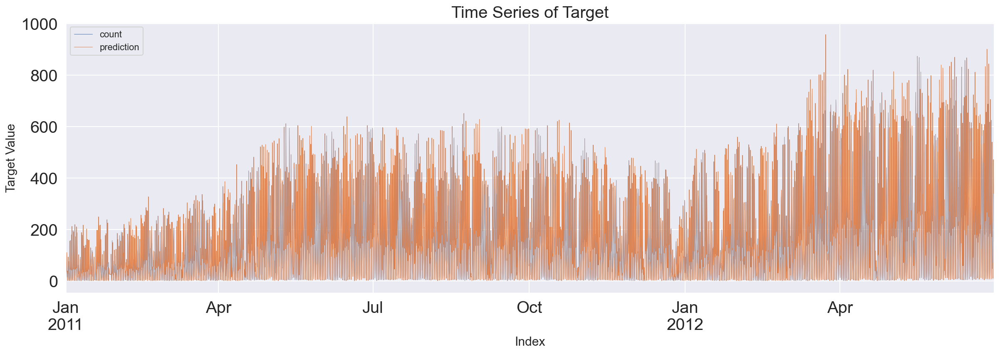

In [106]:
pd.concat([y_train, pd.DataFrame(pred_train_reg1, index=y_train.index, columns=['prediction'])], axis=1).\
         plot(kind='line', figsize=(20,6), xlim=(y_train.index.min(), y_train.index.max()),
              lw=0.5, fontsize=20)

plt.title('Time Series of Target', fontsize=20)
plt.xlabel('Index', fontsize=15)
plt.ylabel('Target Value', fontsize=15)
plt.show()

In [107]:
mae = np.abs(y_train.values.flatten() - pred_train_reg1).mean()
mse = ((y_train.values.flatten() - pred_train_reg1)**2).mean()
mape = (np.abs(y_train.values.flatten() - pred_train_reg1)/y_train.values.flatten()*100).mean()

metrics_df = pd.DataFrame([mae,mse,mape], index=['MAE','MSE','MAPE'], columns=['Score'])
metrics_df

,Score
MAE,0.01
MSE,0.04
MAPE,0.06


In [108]:
def evaluation(y, y_pred, graph_on=False):
    loss_length = len(y.values.flatten()) - len(y_pred)
    if loss_length != 0:
        y = y[loss_length:]
    if graph_on == True:
        pd.concat([y, pd.DataFrame(y_pred, index=y.index, columns=['prediction'])], axis=1).plot(kind='line', figsize=(20,6),
                                                                                                           xlim=(y.index.min(),y.index.max()),
                                                                                                           linewidth=3, fontsize=20)
        plt.title('Time Series of Target', fontsize=20)
        plt.xlabel('Index', fontsize=15)
        plt.ylabel('Target Value', fontsize=15)
    mae = np.abs(y.values.flatten() - y_pred).mean()
    mse = ((y.values.flatten() - y_pred)**2).mean()
    mape = (np.abs(y.values.flatten() - y_pred)/y.values.flatten()*100).mean()

    metrics_df = pd.DataFrame([mae,mse,mape], index=['MAE','MSE','MAPE'], columns=['Score']).T
    residual = pd.DataFrame(y.values.flatten() - y_pred, index=y.index, columns=['Error'])
    return metrics_df, residual
    
def evaluation_trte(y_train, y_train_pred, y_test, y_test_pred, graph_on=False):
    score_train, residual_train = evaluation(y_train, y_train_pred, graph_on=graph_on)
    score_test, residual_test = evaluation(y_test, y_test_pred, graph_on=graph_on)
    score_train_test = pd.concat([score_train, score_test], axis=0)
    score_train_test.index= ['Train','Test']
    return score_train_test, residual_train, residual_test
    

,MAE,MSE,MAPE
Train,0.01,0.04,0.06
Test,0.01,0.00,0.03


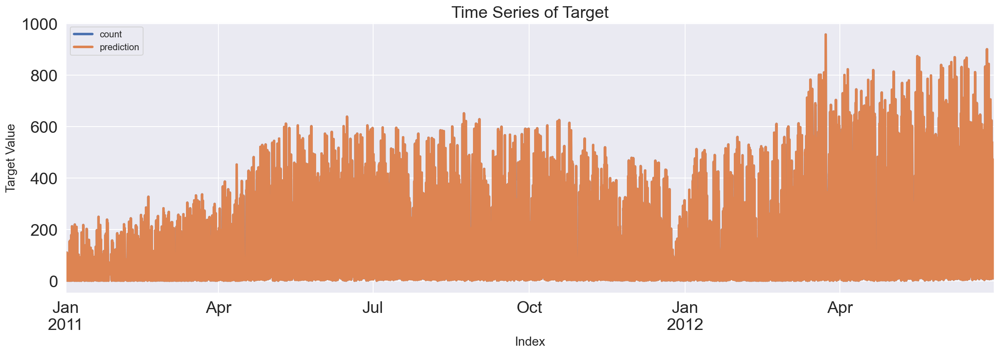

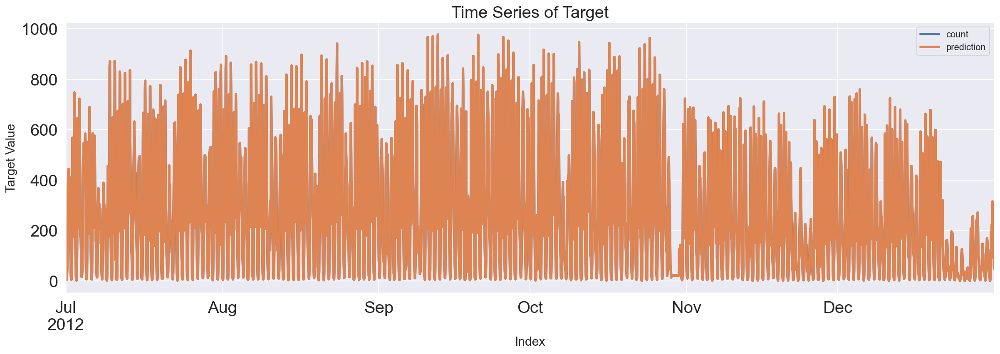

In [109]:
score_reg1, residual_train_reg1, residual_test_reg1 = evaluation_trte(y_train, pred_train_reg1, y_test, pred_test_reg1, graph_on=True)
display(score_reg1)

## raw_nfe로는 성능이 얼마나 나오는지 한 번 보자

In [110]:
raw_nfe

,datetime,season,holiday,workingday,weather,...,humidity,windspeed,casual,registered,count
DateTime,,,,,,,,,,,
2011-01-01 00:00:00,2011-01-01 00:00:00,1.00,0.00,0.00,1.00,...,81.00,0.00,3.00,13.00,16.00
2011-01-01 01:00:00,2011-01-01 01:00:00,1.00,0.00,0.00,1.00,...,80.00,0.00,8.00,32.00,40.00
2011-01-01 02:00:00,2011-01-01 02:00:00,1.00,0.00,0.00,1.00,...,80.00,0.00,5.00,27.00,32.00
2011-01-01 03:00:00,2011-01-01 03:00:00,1.00,0.00,0.00,1.00,...,75.00,0.00,3.00,10.00,13.00
2011-01-01 04:00:00,2011-01-01 04:00:00,1.00,0.00,0.00,1.00,...,75.00,0.00,0.00,1.00,1.00
...,...,...,...,...,...,...,...,...,...,...,...
2012-12-31 19:00:00,2012-12-31 19:00:00,1.00,0.00,1.00,2.00,...,60.00,11.00,11.00,108.00,119.00
2012-12-31 20:00:00,2012-12-31 20:00:00,1.00,0.00,1.00,2.00,...,60.00,11.00,8.00,81.00,89.00
2012-12-31 21:00:00,2012-12-31 21:00:00,1.00,0.00,1.00,1.00,...,60.00,11.00,7.00,83.00,90.00


In [111]:
Y_colname = ['count']
X_remove = ['datetime', 'DateTime', 'temp_group', 'casual', 'registered']
X_colname = [x for x in raw_nfe.columns if x not in Y_colname+X_remove]
X_train, X_test, y_train, y_test = datasplit_ts(raw_nfe, Y_colname, X_colname, '2012-07-01')

Train_size: (13128, 12) Test_size: (4416, 12)
X_train: (13128, 8) Y_train: (13128, 1)
X_test: (4416, 8) Y_test: (4416, 1)


In [1]:
X0 = np.arange(10).reshape(5,2)
X0

array([[0, 1],
       [2, 3],
       [4, 5],
       [6, 7],
       [8, 9]])

In [2]:
X= sm.add_constant(X0, has_constant='skip')
X

array([[1., 0., 1.],
       [1., 2., 3.],
       [1., 4., 5.],
       [1., 6., 7.],
       [1., 8., 9.]])

In [113]:
X= sm.add_constant(X0, has_constant='add')
X

array([[1., 0., 1.],
       [1., 2., 3.],
       [1., 4., 5.],
       [1., 6., 7.],
       [1., 8., 9.]])

In [114]:
X_train.astype(np.float32)
X_test.astype(np.float32)
X_train_1 = sm.add_constant(X_train, has_constant='add')
X_test_1 = sm.add_constant(X_test, has_constant='add')
model = sm.OLS(y_train, X_train_1)
result = model.fit()
display(result.summary())
pred_train = result.predict(X_train_1)
#print(pred_train)
pred_test =  result.predict(X_test_1)
#print(pred_test)

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:                  count   R-squared:                       0.273
Model:                            OLS   Adj. R-squared:                  0.273
Method:                 Least Squares   F-statistic:                     615.9
Date:                Sun, 04 Apr 2021   Prob (F-statistic):               0.00
Time:                        22:42:13   Log-Likelihood:                -83223.
No. Observations:               13128   AIC:                         1.665e+05
Df Residuals:                   13119   BIC:                         1.665e+05
Df Model:                           8                                         
Covariance Type:            nonrobust                                         
==============================================================================
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
const        135.8170      6.781     20.029      0.000     122.525     149.109
season        -0.1792      1.279     -0.140      0.889      -2.686       2.327
holiday      -25.5363      7.417     -3.443      0.001     -40.076     -10.997
workingday    -1.6068      2.670     -0.602      0.547      -6.839       3.626
weather        1.5042      2.081      0.723      0.470      -2.575       5.583
temp           0.2901      1.270      0.228      0.819      -2.200       2.780
atemp          7.3663      1.163      6.334      0.000       5.087       9.646
humidity      -2.4452      0.072    -34.037      0.000      -2.586      -2.304
windspeed      0.5950      0.158      3.767      0.000       0.285       0.905
==============================================================================
Omnibus:                     2515.778   Durbin-Watson:                   0.426
Prob(Omnibus):                  0.000   Jarque-Bera (JB):             4902.884
Skew:                           1.167   Prob(JB):                         0.00
Kurtosis:                       4.875   Cond. No.                         470.
==============================================================================

Notes:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
"""

,MAE,MSE,MAPE
Train,102.45,"18,785.95",489.73
Test,147.81,"42,676.92",309.35


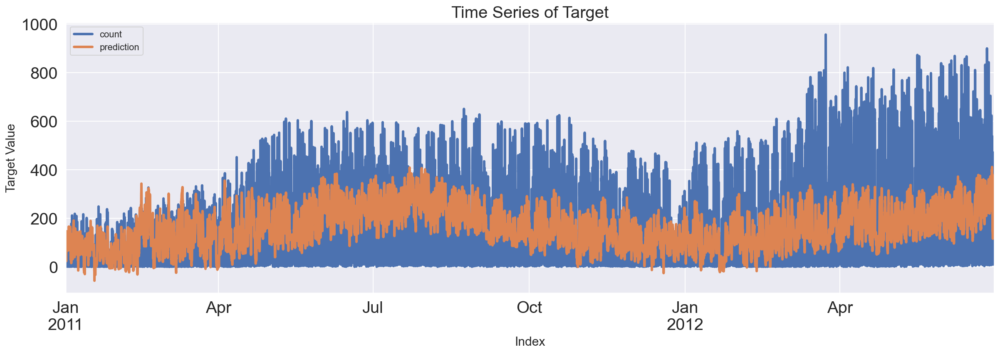

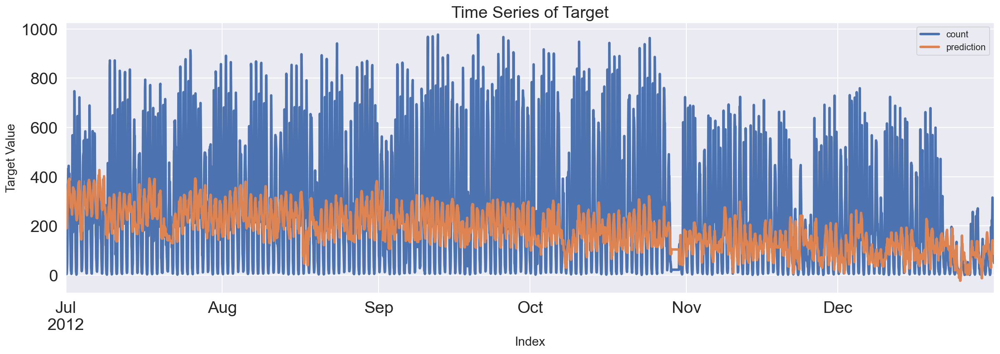

In [115]:
score_reg2, residual_train_reg2, residual_test_reg2 = evaluation_trte(y_train, pred_train, y_test, pred_test, graph_on=True)
display(score_reg2)

In [116]:
mae = np.abs(y_train.values.flatten() - pred_train).mean()
mse = ((y_train.values.flatten() - pred_train)**2).mean()
mape = (np.abs(y_train.values.flatten() - pred_train)/y_train.values.flatten()*100).mean()

metrics_df = pd.DataFrame([mae,mse,mape], index=['MAE','MSE','MAPE'], columns=['Score'])
metrics_df

,Score
MAE,102.45
MSE,"18,785.95"
MAPE,489.73


# ErrorAnalysis

In [117]:
residual_train_reg1['rownum'] = residual_train_reg1.reset_index().index
residual_train_reg1

,Error,rownum
DateTime,,
2011-01-01 00:00:00,-23.95,0
2011-01-01 01:00:00,0.04,1
2011-01-01 02:00:00,0.04,2
2011-01-01 03:00:00,0.04,3
2011-01-01 04:00:00,0.04,4
...,...,...
2012-06-30 19:00:00,-0.00,13123
2012-06-30 20:00:00,0.00,13124
2012-06-30 21:00:00,0.00,13125


In [118]:
residual_train_reg1.iloc[1:]

,Error,rownum
DateTime,,
2011-01-01 01:00:00,0.04,1
2011-01-01 02:00:00,0.04,2
2011-01-01 03:00:00,0.04,3
2011-01-01 04:00:00,0.04,4
2011-01-01 05:00:00,0.03,5
...,...,...
2012-06-30 19:00:00,-0.00,13123
2012-06-30 20:00:00,0.00,13124
2012-06-30 21:00:00,0.00,13125


## 시각화

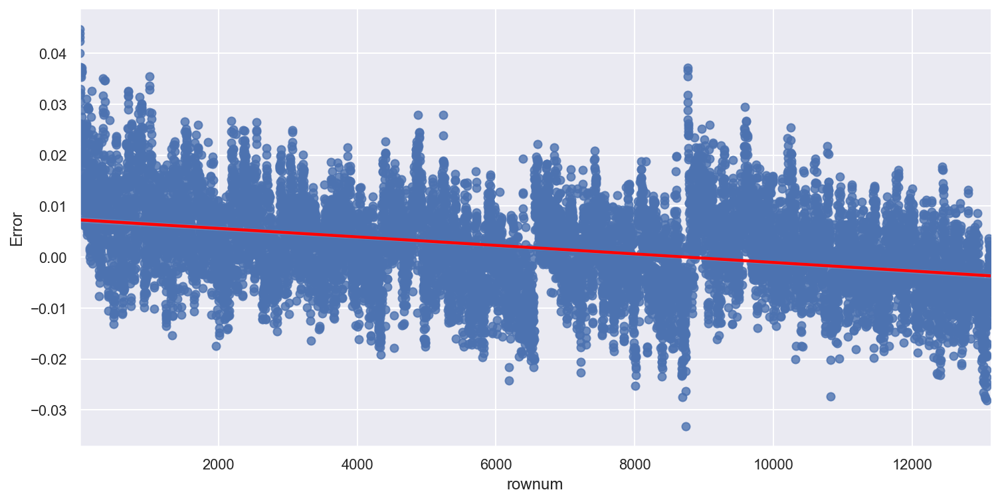

In [122]:
sns.lmplot(data=residual_train_reg1.iloc[1:], x='rownum', y='Error',
          fit_reg=True, line_kws={'color':'red'}, size=5.2, aspect=2, ci=99, sharey=True)

<AxesSubplot:xlabel='Error', ylabel='Density'>

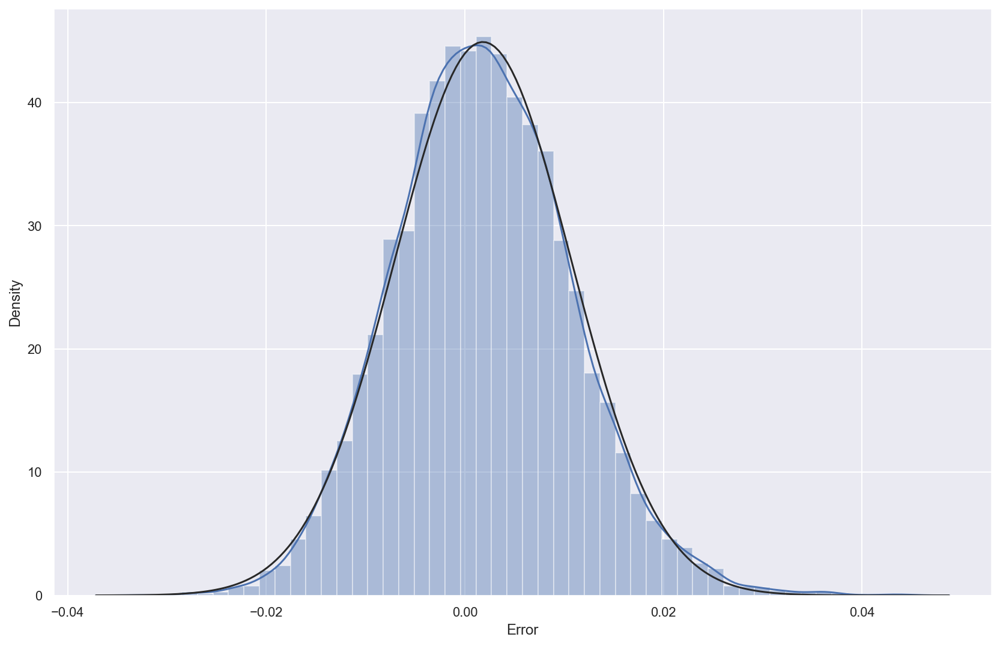

In [126]:
sns.distplot(residual_train_reg1['Error'].iloc[1:], norm_hist=True, fit=sp.stats.norm)

- lag analysis

In [127]:
warnings.simplefilter('ignore')

*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2-D array with a single row if you intend to specify the same RGB or RGBA value for all points.
*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2-D array with a single row if you intend to specify the same RGB or RGBA value for all points.
*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2-D array with a single row if you intend to specify the same RGB or RGBA value for all points.
*c* argument looks like a single numeric RGB o

<AxesSubplot:xlabel='y(t)', ylabel='y(t + 50)'>

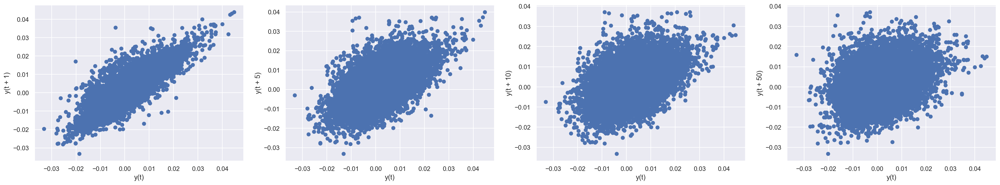

In [128]:
figure, axes = plt.subplots(1, 4, figsize=(30,5))
pd.plotting.lag_plot(residual_train_reg1['Error'].iloc[1:], lag=1, ax=axes[0])
pd.plotting.lag_plot(residual_train_reg1['Error'].iloc[1:], lag=5, ax=axes[1])
pd.plotting.lag_plot(residual_train_reg1['Error'].iloc[1:], lag=10, ax=axes[2])
pd.plotting.lag_plot(residual_train_reg1['Error'].iloc[1:], lag=50, ax=axes[3])

- 위 pd.plotting.lag_plot과 비교
    - 일단 아래 lag=0일때 y값으 높은 이유. 자기자신과 상관관게는 당연히 1
    - lag 1일때, 거의 0.8나오는데, 그게 위 첫번째 plot의 상관관계

- acf 그래프 y=0 부근에 $x=y^2$ 같은 영역있음
- 일종의 유의수준
- 이걸 벗어나면 autocorrelation이 있다.

In [ ]:
# lags = 몇 lag까지 보여줄 것이냐
figure, axes = plt.subplots(2,1,figsize=(12,5))
figure = sm.graphics.tsa.plot_acf(residual_train_reg1['Error'].iloc[1:], lags=100, use_vlines=True, ax=axes[0])
figure = sm.graphics.tsa.plot_pacf(residual_train_reg1['Error'].iloc[1:], lags=100, use_vlines=True, ax=axes[1])

## 통계량

- 통계량, 피밸류, 사용된 래그, ...

### 잔차 정상성 augmented-dicky-fuller test

In [151]:
stationarity = pd.Series(sm.tsa.stattools.adfuller(residual_train_reg1['Error'].iloc[1:])[0:4], index=['Test Statistics','p-value','Used Lags','Used Observations'])
for key, value in sm.tsa.stattools.adfuller(residual_train_reg1['Error'].iloc[1:])[4].items():
    stationarity['Critical Value(%s)'%key] = value
stationarity['Maximum Information Criteria'] = sm.tsa.stattools.adfuller(residual_train_reg1['Error'].iloc[1:])[5]
stationarity = pd.DataFrame(stationarity, columns=['stationarity'])
stationarity

,stationarity
Test Statistics,-9.82
p-value,0.00
Used Lags,41.00
Used Observations,"13,085.00"
Critical Value(1%),-3.43
Critical Value(5%),-2.86
Critical Value(10%),-2.57
Maximum Information Criteria,"-106,838.93"


### 잔차 정규분포 shapiro-wilk test

In [177]:
normality = pd.DataFrame(np.array(sp.stats.shapiro(residual_train_reg1["Error"])).reshape(1,2), index=['normality'], columns=['Test Statistics', 'p-value'])
normality

,Test Statistics,p-value
normality,0.01,0.00


### 자기상관 테스트 Ljung-Box test

In [176]:
autocorrelation = pd.concat([pd.DataFrame(sm.stats.diagnostic.acorr_ljungbox(residual_train_reg1['Error'], lags=[1,5,10,50])[0], columns=['Test Statistics']),
                             pd.DataFrame(sm.stats.diagnostic.acorr_ljungbox(residual_train_reg1['Error'], lags=[1,5,10,50])[1], columns=['p-value'])], axis=1).T
autocorrelation.columns = ['Autocorr(lag1)', 'Autocorr(lag5)', 'Autocorr(lag10)', 'Autocorr(lag50)']
autocorrelation

,Autocorr(lag1),Autocorr(lag5),Autocorr(lag10),Autocorr(lag50)
Test Statistics,0.00,0.01,0.03,0.10
p-value,0.98,1.00,1.00,1.00


### 등분산 테스트 Goldfeld-Quandt test

In [180]:
heteroscedasticity = pd.DataFrame([sm.stats.diagnostic.het_goldfeldquandt(residual_train_reg1['Error'], X_train.values, alternative='two-sided')],
                                  index=['heteroscedasticity'], columns=['Test Statistics', 'p-value', 'Alternative']).T
heteroscedasticity

,Heteroscedasticity
Test Statistics,0.00
p-value,0.00
Alternative,two-sided


In [184]:
Error_Analysis = pd.concat([stationarity, normality, autocorrelation, heteroscedasticity], join='outer', axis=1)
Error_Analysis = Error_Analysis.loc[['Test Statistics', 'p-value', 'Alternative', 'Used Lags', 'Used Observations',
                                    'Critical Value(1%)', 'Critical Value(5%)', 'Critical Value(10%)',
                                   'Maximum Information Criteria'],:]
Error_Analysis

,stationarity,Test Statistics,p-value,Autocorr(lag1),Autocorr(lag5),Autocorr(lag10),Autocorr(lag50),Heteroscedasticity
Test Statistics,-9.82,nan,nan,0.00,0.01,0.03,0.10,0.00
p-value,0.00,nan,nan,0.98,1.00,1.00,1.00,0.00
Alternative,nan,nan,nan,nan,nan,nan,nan,two-sided
Used Lags,41.00,nan,nan,nan,nan,nan,nan,NaN
Used Observations,"13,085.00",nan,nan,nan,nan,nan,nan,NaN
Critical Value(1%),-3.43,nan,nan,nan,nan,nan,nan,NaN
Critical Value(5%),-2.86,nan,nan,nan,nan,nan,nan,NaN
Critical Value(10%),-2.57,nan,nan,nan,nan,nan,nan,NaN
Maximum Information Criteria,"-106,838.93",nan,nan,nan,nan,nan,nan,NaN


## code summary

In [189]:
### Functionalize
### Error analysis
def stationarity_adf_test(Y_Data, Target_name):
    if len(Target_name) == 0:
        Stationarity_adf = pd.Series(sm.tsa.stattools.adfuller(Y_Data)[0:4],
                                     index=['Test Statistics', 'p-value', 'Used Lag', 'Used Observations'])
        for key, value in sm.tsa.stattools.adfuller(Y_Data)[4].items():
            Stationarity_adf['Critical Value(%s)'%key] = value
            Stationarity_adf['Maximum Information Criteria'] = sm.tsa.stattools.adfuller(Y_Data)[5]
            Stationarity_adf = pd.DataFrame(Stationarity_adf, columns=['Stationarity_adf'])
    else:
        Stationarity_adf = pd.Series(sm.tsa.stattools.adfuller(Y_Data[Target_name])[0:4],
                                     index=['Test Statistics', 'p-value', 'Used Lag', 'Used Observations'])
        for key, value in sm.tsa.stattools.adfuller(Y_Data[Target_name])[4].items():
            Stationarity_adf['Critical Value(%s)'%key] = value
            Stationarity_adf['Maximum Information Criteria'] = sm.tsa.stattools.adfuller(Y_Data[Target_name])[5]
            Stationarity_adf = pd.DataFrame(Stationarity_adf, columns=['Stationarity_adf'])
    return Stationarity_adf

def stationarity_kpss_test(Y_Data, Target_name):
    if len(Target_name) == 0:
        Stationarity_kpss = pd.Series(sm.tsa.stattools.kpss(Y_Data)[0:3],
                                      index=['Test Statistics', 'p-value', 'Used Lag'])
        for key, value in sm.tsa.stattools.kpss(Y_Data)[3].items():
            Stationarity_kpss['Critical Value(%s)'%key] = value
            Stationarity_kpss = pd.DataFrame(Stationarity_kpss, columns=['Stationarity_kpss'])
    else:
        Stationarity_kpss = pd.Series(sm.tsa.stattools.kpss(Y_Data[Target_name])[0:3],
                                      index=['Test Statistics', 'p-value', 'Used Lag'])
        for key, value in sm.tsa.stattools.kpss(Y_Data[Target_name])[3].items():
            Stationarity_kpss['Critical Value(%s)'%key] = value
            Stationarity_kpss = pd.DataFrame(Stationarity_kpss, columns=['Stationarity_kpss'])
    return Stationarity_kpss

def error_analysis(Y_Data, Target_name, X_Data, graph_on=False):
    for x in Target_name:
        Target_name = x
    X_Data = X_Data.loc[Y_Data.index]

    if graph_on == True:
        ##### Error Analysis(Plot)
        Y_Data['RowNum'] = Y_Data.reset_index().index

        # Stationarity(Trend) Analysis
        sns.set(palette="muted", color_codes=True, font_scale=2)
        sns.lmplot(x='RowNum', y=Target_name, data=Y_Data, fit_reg=True, line_kws={'color':'red'}, size=5.2, aspect=2, ci=99, sharey=True)
        del Y_Data['RowNum']

        # Normal Distribution Analysis
        figure, axes = plt.subplots(figsize=(12,8))
        sns.distplot(Y_Data[Target_name], norm_hist='True', fit=stats.norm, ax=axes)

        # Lag Analysis
        length = int(len(Y_Data[Target_name])/10)
        figure, axes = plt.subplots(1, 4, figsize=(12,3))
        pd.plotting.lag_plot(Y_Data[Target_name], lag=1, ax=axes[0])
        pd.plotting.lag_plot(Y_Data[Target_name], lag=5, ax=axes[1])
        pd.plotting.lag_plot(Y_Data[Target_name], lag=10, ax=axes[2])
        pd.plotting.lag_plot(Y_Data[Target_name], lag=50, ax=axes[3])

        # Autocorrelation Analysis
        figure, axes = plt.subplots(2,1,figsize=(12,5))
        sm.tsa.graphics.plot_acf(Y_Data[Target_name], lags=100, use_vlines=True, ax=axes[0])
        sm.tsa.graphics.plot_pacf(Y_Data[Target_name], lags=100, use_vlines=True, ax=axes[1])

    ##### Error Analysis(Statistics)
    # Checking Stationarity
    # Null Hypothesis: The Time-series is non-stationalry
    Stationarity_adf = stationarity_adf_test(Y_Data, Target_name)
    Stationarity_kpss = stationarity_kpss_test(Y_Data, Target_name)

    # Checking of Normality
    # Null Hypothesis: The residuals are normally distributed
    Normality = pd.DataFrame([stats.shapiro(Y_Data[Target_name])],
                             index=['Normality'], columns=['Test Statistics', 'p-value']).T

    # Checking for Autocorrelation
    # Null Hypothesis: Autocorrelation is absent
    Autocorrelation = pd.concat([pd.DataFrame(sm.stats.diagnostic.acorr_ljungbox(Y_Data[Target_name], lags=[1,5,10,50])[0], columns=['Test Statistics']),
                                 pd.DataFrame(sm.stats.diagnostic.acorr_ljungbox(Y_Data[Target_name], lags=[1,5,10,50])[1], columns=['p-value'])], axis=1).T
    Autocorrelation.columns = ['Autocorr(lag1)', 'Autocorr(lag5)', 'Autocorr(lag10)', 'Autocorr(lag50)']

    # Checking Heteroscedasticity
    # Null Hypothesis: Error terms are homoscedastic
    Heteroscedasticity = pd.DataFrame([sm.stats.diagnostic.het_goldfeldquandt(Y_Data[Target_name], X_Data.values, alternative='two-sided')],
                                      index=['Heteroscedasticity'], columns=['Test Statistics', 'p-value', 'Alternative']).T
    Score = pd.concat([Stationarity_adf, Stationarity_kpss, Normality, Autocorrelation, Heteroscedasticity], join='outer', axis=1)
    index_new = ['Test Statistics', 'p-value', 'Alternative', 'Used Lag', 'Used Observations',
                 'Critical Value(1%)', 'Critical Value(5%)', 'Critical Value(10%)', 'Maximum Information Criteria']
    Score.reindex(index_new)
    return Score
# error_analysis(Resid_tr_reg1[1:], ['Error'], X_train, graph_on=True)

*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2-D array with a single row if you intend to specify the same RGB or RGBA value for all points.
*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2-D array with a single row if you intend to specify the same RGB or RGBA value for all points.
*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2-D array with a single row if you intend to specify the same RGB or RGBA value for all points.
*c* argument looks like a single numeric RGB o

,Stationarity_adf,Stationarity_kpss,Normality,Autocorr(lag1),Autocorr(lag5),Autocorr(lag10),Autocorr(lag50),Heteroscedasticity
Test Statistics,-9.98,0.09,0.01,0.00,0.01,0.03,0.10,0.00
p-value,0.00,0.10,0.00,0.98,1.00,1.00,1.00,0.00
Used Lag,41.00,41.00,nan,nan,nan,nan,nan,NaN
Used Observations,"13,086.00",nan,nan,nan,nan,nan,nan,NaN
Critical Value(1%),-3.43,nan,nan,nan,nan,nan,nan,NaN
Maximum Information Criteria,"-106,845.57",nan,nan,nan,nan,nan,nan,NaN
Critical Value(10%),nan,0.35,nan,nan,nan,nan,nan,NaN
Alternative,nan,nan,nan,nan,nan,nan,nan,two-sided


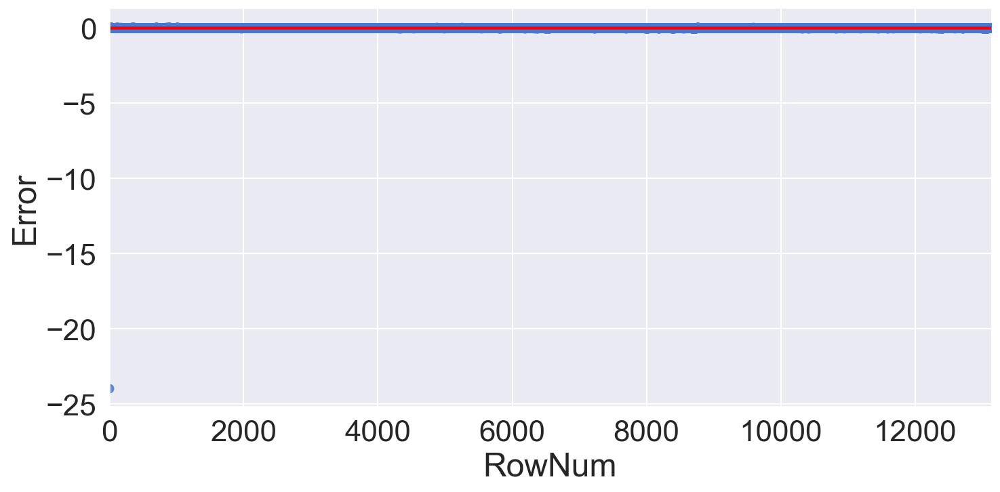

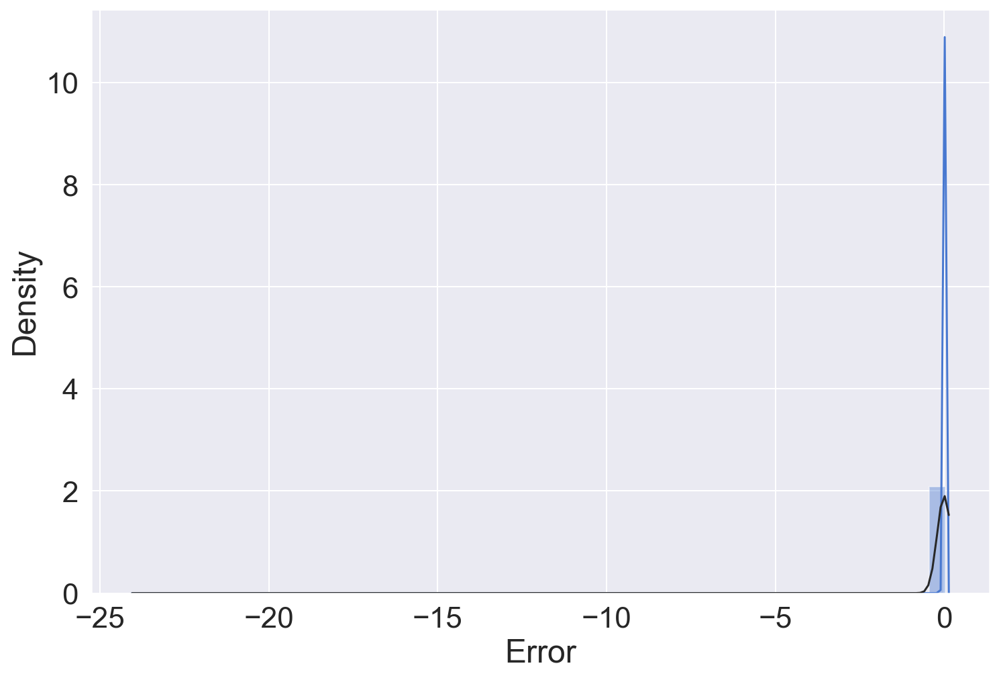

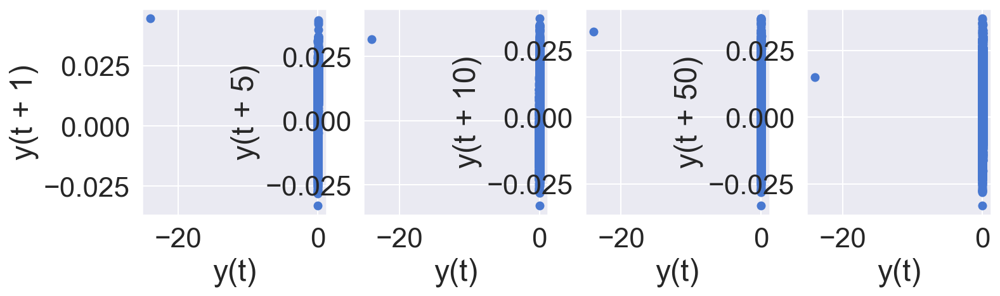

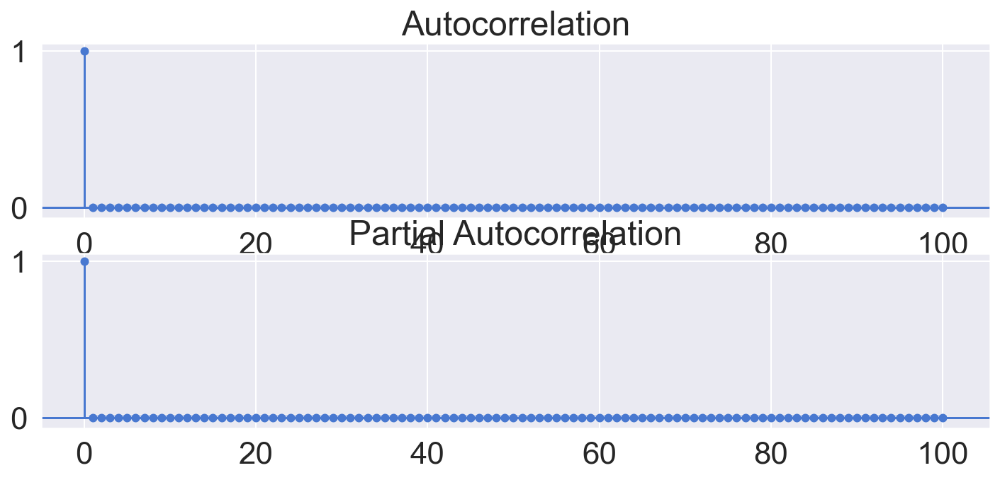

In [191]:
error_analysis(residual_train_reg1, ['Error'], X_train, graph_on=True)
#정상성(ADF) / 비정규분포 / 자기상관 없음 / 등분산 아님

*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2-D array with a single row if you intend to specify the same RGB or RGBA value for all points.
*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2-D array with a single row if you intend to specify the same RGB or RGBA value for all points.
*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2-D array with a single row if you intend to specify the same RGB or RGBA value for all points.
*c* argument looks like a single numeric RGB o

,Stationarity_adf,Stationarity_kpss,Normality,Autocorr(lag1),Autocorr(lag5),Autocorr(lag10),Autocorr(lag50),Heteroscedasticity
Test Statistics,-9.82,7.52,1.00,"9,615.96","32,903.39","47,262.88","116,653.97",1.09
p-value,0.00,0.01,0.00,0.00,0.00,0.00,0.00,0.00
Used Lag,41.00,41.00,nan,nan,nan,nan,nan,NaN
Used Observations,"13,085.00",nan,nan,nan,nan,nan,nan,NaN
Critical Value(1%),-3.43,nan,nan,nan,nan,nan,nan,NaN
Maximum Information Criteria,"-106,838.93",nan,nan,nan,nan,nan,nan,NaN
Critical Value(10%),nan,0.35,nan,nan,nan,nan,nan,NaN
Alternative,nan,nan,nan,nan,nan,nan,nan,two-sided


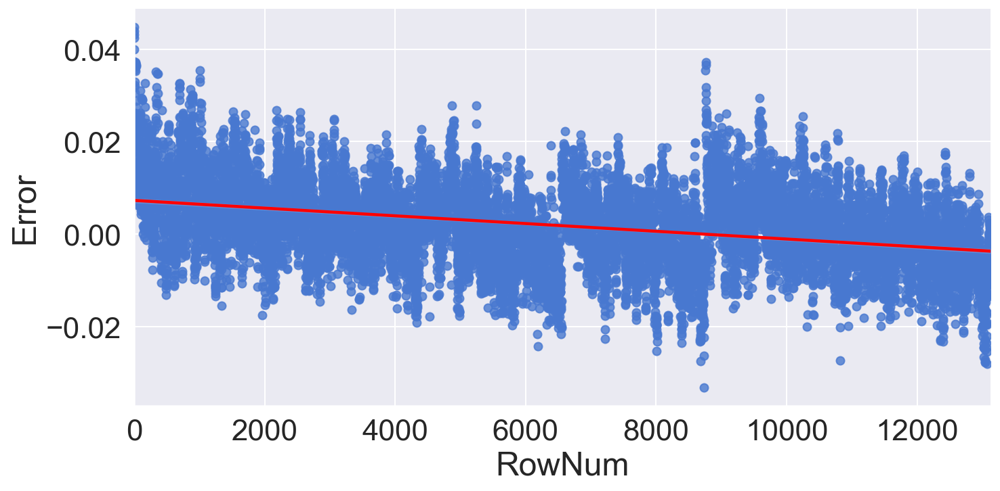

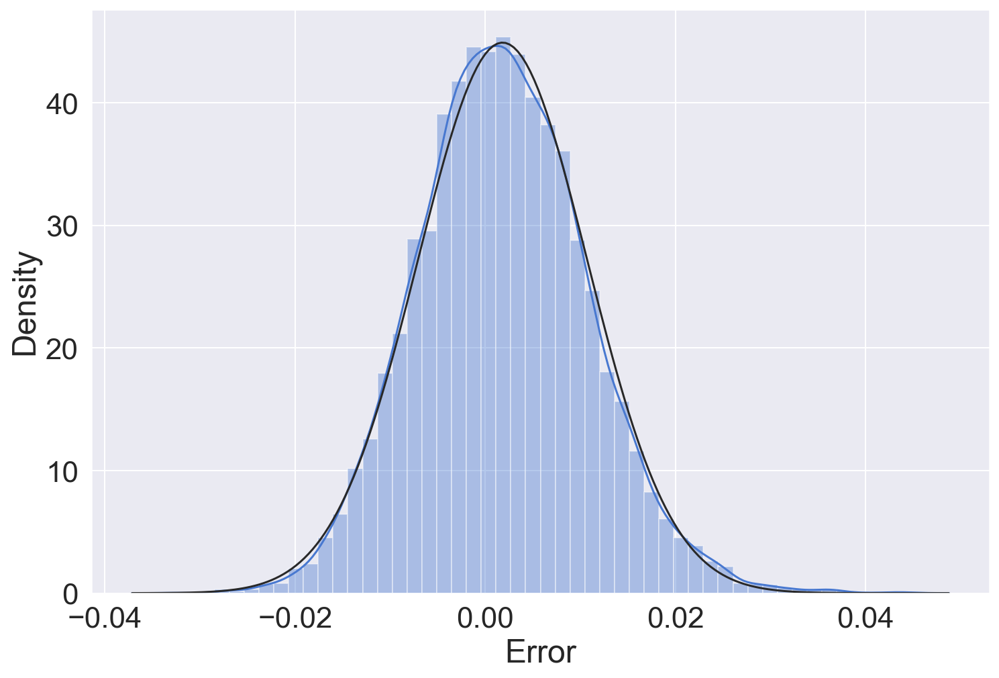

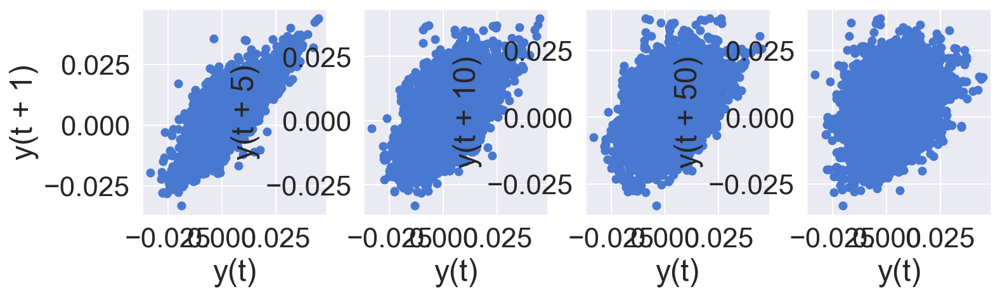

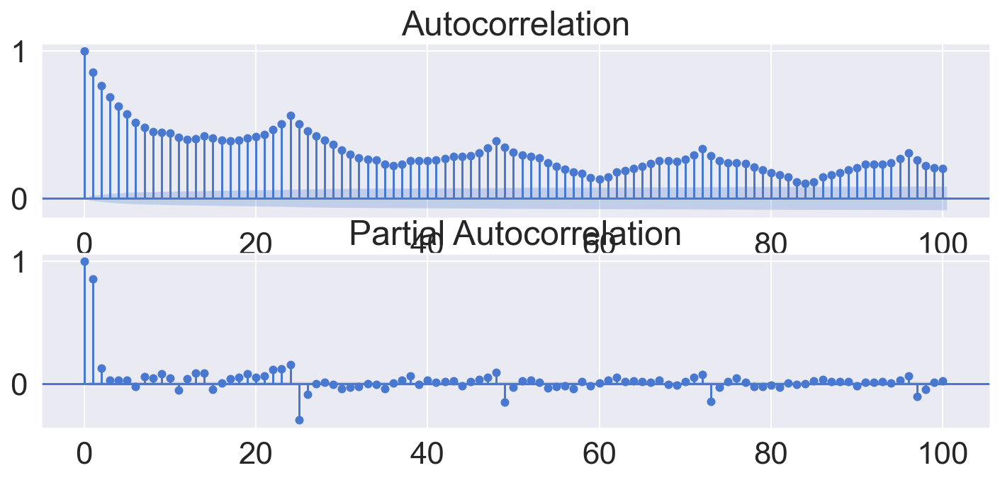

In [190]:
error_analysis(residual_train_reg1.iloc[1:], ['Error'], X_train, graph_on=True)
#정상성(ADF) / 비정상성(KPSS) / 비정규분포 / 자기상관 있음 / 등분산 아님

# Summary

## non-feature-engineering

Train_size: (13128, 12) Test_size: (4416, 12)
X_train: (13128, 8) Y_train: (13128, 1)
X_test: (4416, 8) Y_test: (4416, 1)


<class 'statsmodels.iolib.summary.Summary'>
"""
                                 OLS Regression Results                                
=======================================================================================
Dep. Variable:                  count   R-squared (uncentered):                   0.638
Model:                            OLS   Adj. R-squared (uncentered):              0.638
Method:                 Least Squares   F-statistic:                              2889.
Date:                Sun, 04 Apr 2021   Prob (F-statistic):                        0.00
Time:                        23:41:20   Log-Likelihood:                         -83421.
No. Observations:               13128   AIC:                                  1.669e+05
Df Residuals:                   13120   BIC:                                  1.669e+05
Df Model:                           8                                                  
Covariance Type:            nonrobust                                                  
==============================================================================
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
season         3.3659      1.286      2.618      0.009       0.846       5.886
holiday       -6.2896      7.466     -0.842      0.400     -20.924       8.345
workingday    10.3553      2.641      3.921      0.000       5.178      15.533
weather        7.1906      2.093      3.436      0.001       3.089      11.292
temp          -7.8544      1.222     -6.429      0.000     -10.249      -5.460
atemp         16.0695      1.095     14.676      0.000      13.923      18.216
humidity      -1.7353      0.063    -27.356      0.000      -1.860      -1.611
windspeed      2.2749      0.136     16.745      0.000       2.009       2.541
==============================================================================
Omnibus:                     2168.771   Durbin-Watson:                   0.419
Prob(Omnibus):                  0.000   Jarque-Bera (JB):             3942.747
Skew:                           1.050   Prob(JB):                         0.00
Kurtosis:                       4.672   Cond. No.                         450.
==============================================================================

Notes:
[1] R² is computed without centering (uncentered) since the model does not contain a constant.
[2] Standard Errors assume that the covariance matrix of the errors is correctly specified.
"""

,MAE,MSE,MAPE
Train,103.09,"19,360.42",458.48
Test,150.03,"43,410.27",316.61


*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2-D array with a single row if you intend to specify the same RGB or RGBA value for all points.
*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2-D array with a single row if you intend to specify the same RGB or RGBA value for all points.
*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2-D array with a single row if you intend to specify the same RGB or RGBA value for all points.
*c* argument looks like a single numeric RGB o

,Stationarity_adf,Stationarity_kpss,Normality,Autocorr(lag1),Autocorr(lag5),Autocorr(lag10),Autocorr(lag50),Heteroscedasticity
Test Statistics,-9.25,11.19,0.94,"8,204.84","12,494.43","13,138.03","48,485.56",1.76
p-value,0.00,0.01,0.00,0.00,0.00,0.00,0.00,0.00
Used Lag,40.00,41.00,nan,nan,nan,nan,nan,NaN
Used Observations,"13,087.00",nan,nan,nan,nan,nan,nan,NaN
Critical Value(1%),-3.43,nan,nan,nan,nan,nan,nan,NaN
Maximum Information Criteria,"143,252.82",nan,nan,nan,nan,nan,nan,NaN
Critical Value(10%),nan,0.35,nan,nan,nan,nan,nan,NaN
Alternative,nan,nan,nan,nan,nan,nan,nan,two-sided


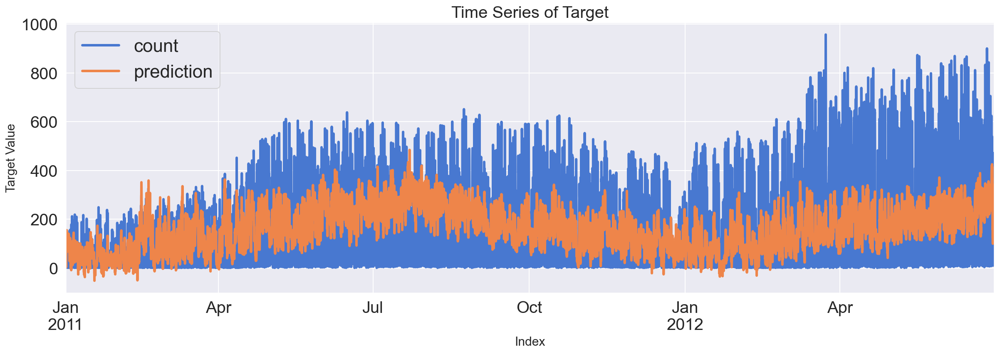

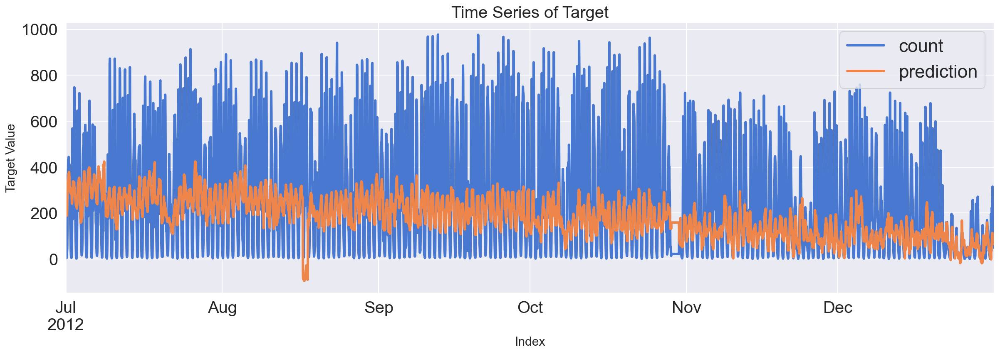

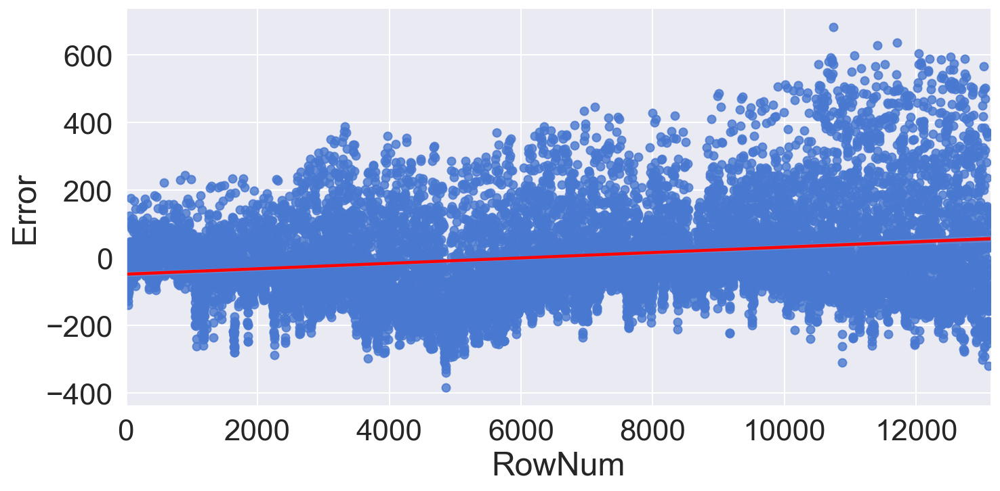

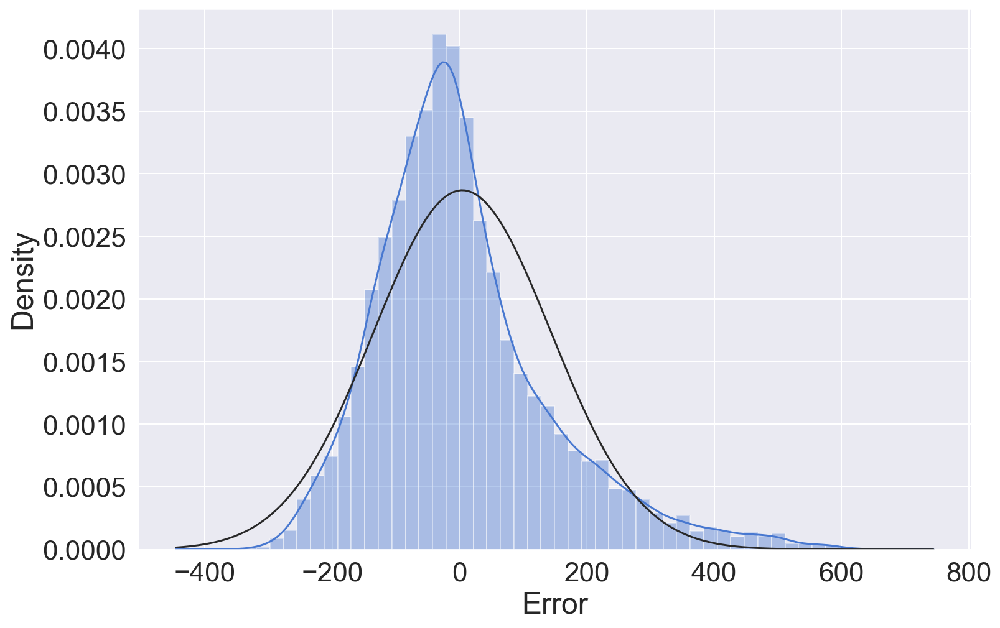

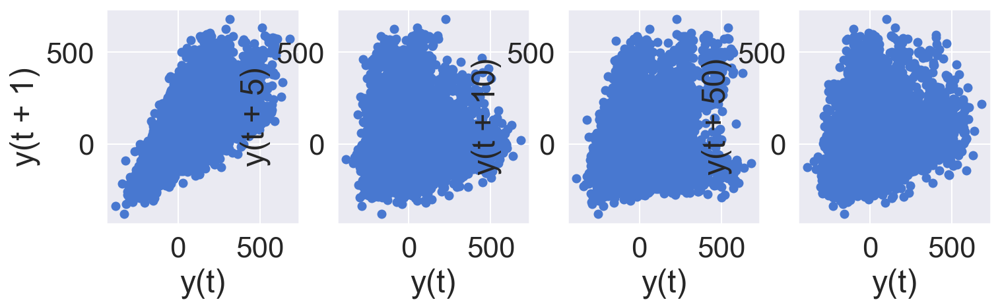

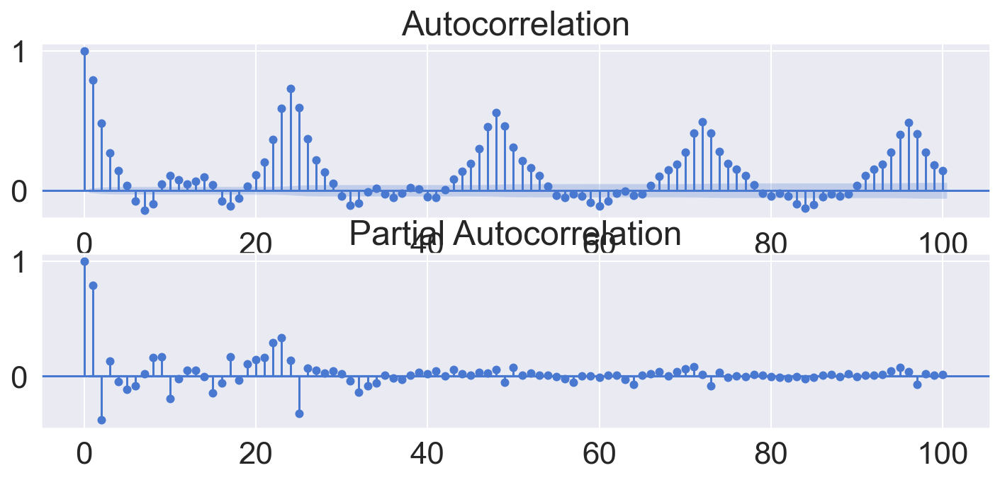

In [195]:
file = './Data/BikeSharingDemand/Bike_Sharing_Demand_Full.csv'
raw_all = pd.read_csv(file)

raw_rd = non_feature_engineering(raw_all)

Y_colname = ['count']
X_remove = ['datetime','DateTime','temp_group','casual','registered']
X_colname = [x for x in raw_rd.columns if x not in Y_colname+X_remove]
X_train_rd, X_test_rd, Y_train_rd, Y_test_rd = datasplit_ts(raw_rd, Y_colname, X_colname, '2012-07-01')

fit_reg1_rd = sm.OLS(Y_train_rd, X_train_rd).fit()
display(fit_reg1_rd.summary())
pred_tr_reg1_rd = fit_reg1_rd.predict(X_train_rd).values
pred_te_reg1_rd = fit_reg1_rd.predict(X_test_rd).values


Score_reg1_rd, Resid_tr_reg1_rd, Resid_te_reg1_rd = evaluation_trte(Y_train_rd, pred_tr_reg1_rd, 
                                                                Y_test_rd, pred_te_reg1_rd, graph_on=True)
display(Score_reg1_rd)

error_analysis(Resid_tr_reg1_rd, ['Error'], X_train_rd, graph_on=True)

## feature-engineering

Train_size: (13128, 30) Test_size: (4416, 30)
X_train: (13128, 25) Y_train: (13128, 1)
X_test: (4416, 25) Y_test: (4416, 1)


<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:                  count   R-squared:                       1.000
Model:                            OLS   Adj. R-squared:                  1.000
Method:                 Least Squares   F-statistic:                 3.362e+08
Date:                Sun, 04 Apr 2021   Prob (F-statistic):               0.00
Time:                        23:42:30   Log-Likelihood:                 1906.2
No. Observations:               13128   AIC:                            -3764.
Df Residuals:                   13104   BIC:                            -3585.
Df Model:                          23                                         
Covariance Type:            nonrobust                                         
===================================================================================
                      coef    std err          t      P>|t|      [0.025      0.975]
-----------------------------------------------------------------------------------
season             -0.0005      0.004     -0.129      0.897      -0.009       0.008
holiday             0.0083      0.014      0.612      0.540      -0.018       0.035
workingday          0.0079      0.007      1.184      0.236      -0.005       0.021
weather             0.0042      0.003      1.232      0.218      -0.003       0.011
temp                0.0022      0.002      1.075      0.282      -0.002       0.006
atemp              -0.0025      0.002     -1.347      0.178      -0.006       0.001
humidity           -0.0001      0.000     -0.845      0.398      -0.000       0.000
windspeed           0.0003      0.000      1.062      0.288      -0.000       0.001
count_trend      9.161e-05   8.57e-05      1.069      0.285   -7.64e-05       0.000
count_seasonal   1.984e-05   2.56e-05      0.775      0.438   -3.03e-05       7e-05
count_day        4.177e-05   8.36e-05      0.500      0.617      -0.000       0.000
count_week      -4.345e-05   9.61e-05     -0.452      0.651      -0.000       0.000
count_diff          1.0000    2.9e-05   3.45e+04      0.000       1.000       1.000
year            -1.387e-05   7.63e-06     -1.818      0.069   -2.88e-05    1.09e-06
quarter            -0.0032      0.008     -0.416      0.677      -0.018       0.012
quarter_ver2        0.0004      0.002      0.180      0.857      -0.004       0.005
month               0.0026      0.002      1.051      0.293      -0.002       0.007
day                 0.0004      0.000      1.728      0.084   -4.91e-05       0.001
hour                0.0006      0.000      1.538      0.124      -0.000       0.001
dayofweek           0.0003      0.002      0.224      0.823      -0.003       0.003
count_lag1          1.0000    2.7e-05    3.7e+04      0.000       1.000       1.000
count_lag2      -1.926e-05   2.59e-05     -0.744      0.457      -7e-05    3.15e-05
quarter_dummy_2     0.0022      0.006      0.391      0.696      -0.009       0.013
quarter_dummy_3     0.0027      0.005      0.505      0.614      -0.008       0.013
quarter_dummy_4    -0.0036      0.005     -0.707      0.480      -0.014       0.006
==============================================================================
Omnibus:                    54426.083   Durbin-Watson:                   1.002
Prob(Omnibus):                  0.000   Jarque-Bera (JB):      93552024983.813
Skew:                        -114.255   Prob(JB):                         0.00
Kurtosis:                   13078.751   Cond. No.                     5.90e+18
==============================================================================

Notes:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
[2] The smallest eigenvalue is 1.58e-27. This might indicate that there are
strong multicollinearity problems or that the design matrix is singular.
"""

,MAE,MSE,MAPE
Train,0.01,0.04,0.06
Test,0.01,0.00,0.03


*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2-D array with a single row if you intend to specify the same RGB or RGBA value for all points.
*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2-D array with a single row if you intend to specify the same RGB or RGBA value for all points.
*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2-D array with a single row if you intend to specify the same RGB or RGBA value for all points.
*c* argument looks like a single numeric RGB o

,Stationarity_adf,Stationarity_kpss,Normality,Autocorr(lag1),Autocorr(lag5),Autocorr(lag10),Autocorr(lag50),Heteroscedasticity
Test Statistics,-9.98,0.09,0.01,0.00,0.01,0.03,0.10,0.00
p-value,0.00,0.10,0.00,0.98,1.00,1.00,1.00,0.00
Used Lag,41.00,41.00,nan,nan,nan,nan,nan,NaN
Used Observations,"13,086.00",nan,nan,nan,nan,nan,nan,NaN
Critical Value(1%),-3.43,nan,nan,nan,nan,nan,nan,NaN
Maximum Information Criteria,"-106,845.57",nan,nan,nan,nan,nan,nan,NaN
Critical Value(10%),nan,0.35,nan,nan,nan,nan,nan,NaN
Alternative,nan,nan,nan,nan,nan,nan,nan,two-sided


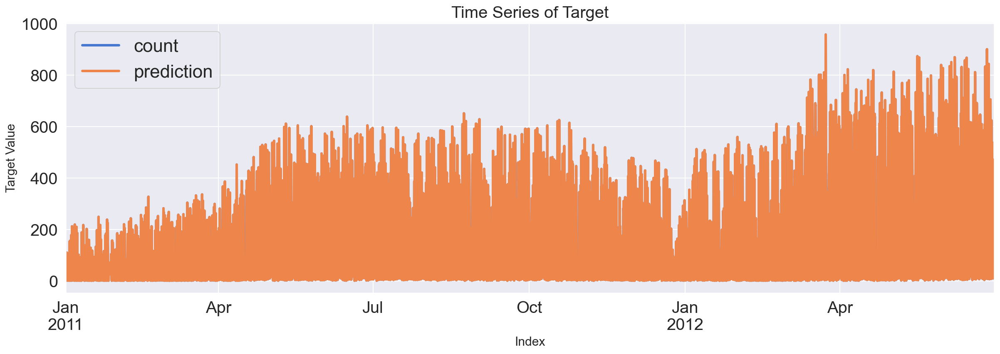

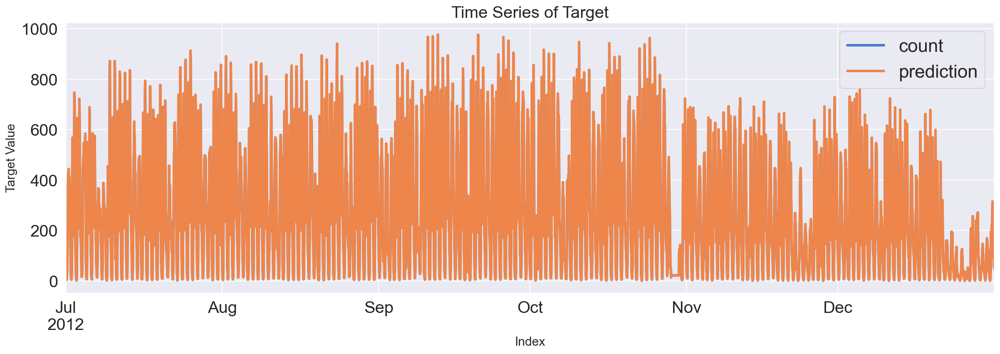

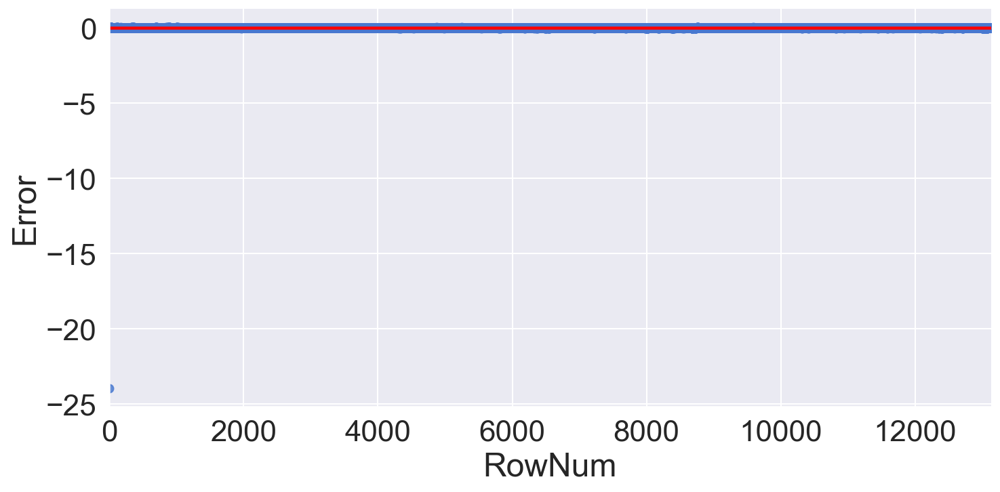

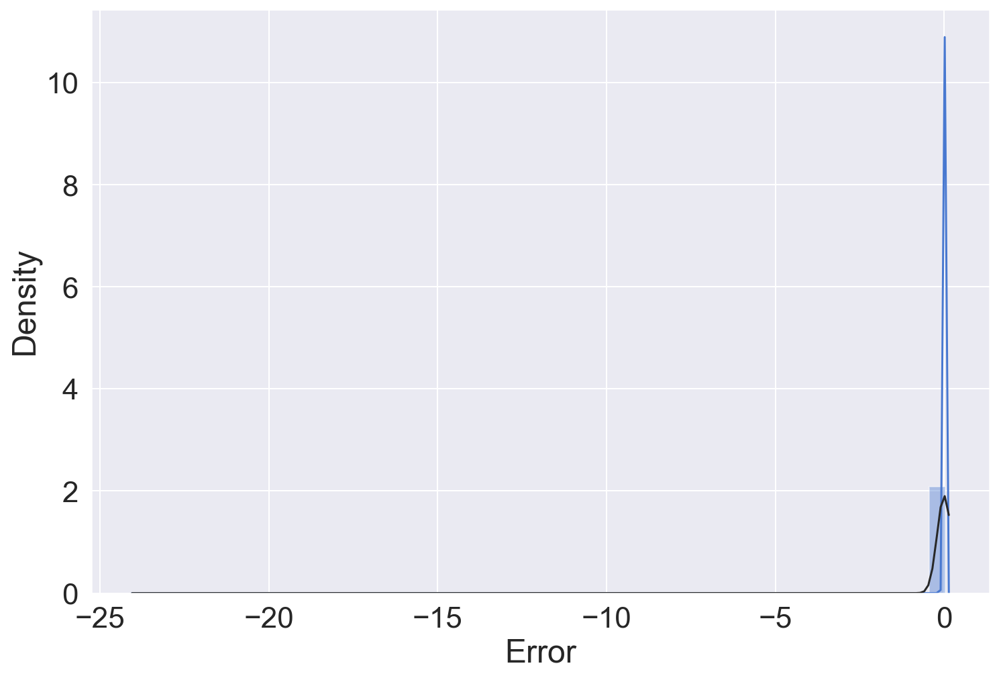

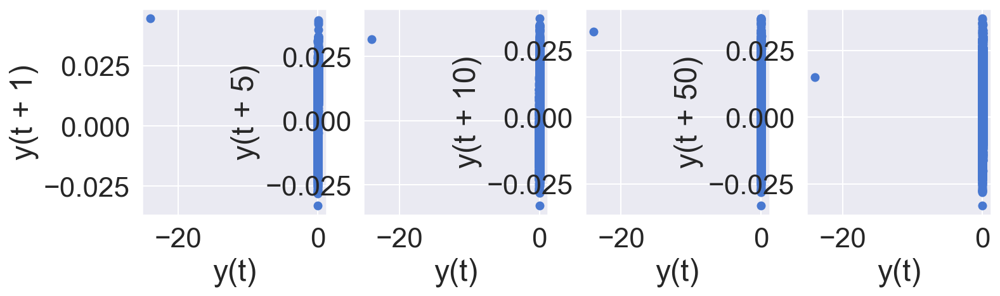

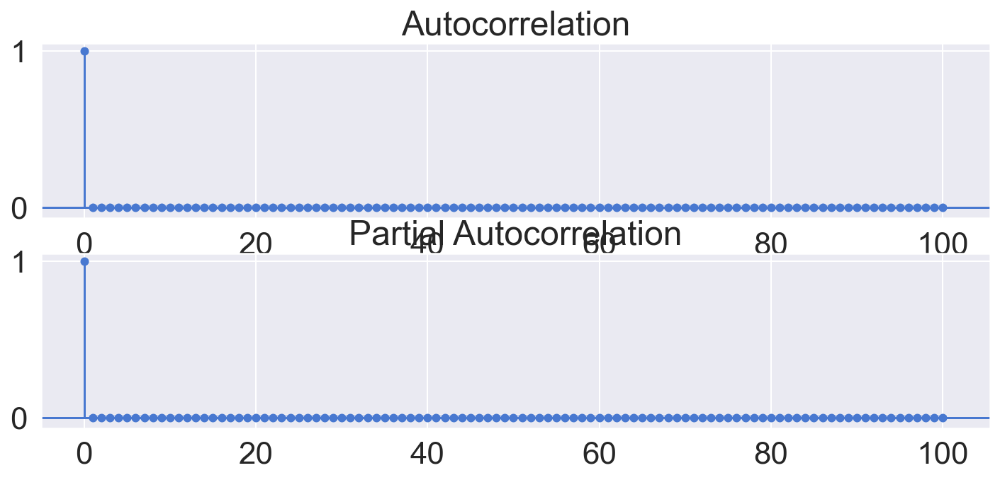

In [196]:
# Data Loading
# location = 'https://raw.githubusercontent.com/cheonbi/DataScience/master/Data/Bike_Sharing_Demand_Full.csv'
location = './Data/BikeSharingDemand/Bike_Sharing_Demand_Full.csv'
raw_all = pd.read_csv(location)

# Feature Engineering
raw_fe = feature_engineering(raw_all)

# Data Split
# Confirm of input and output
Y_colname = ['count']
X_remove = ['datetime', 'DateTime', 'temp_group', 'casual', 'registered']
X_colname = [x for x in raw_fe.columns if x not in Y_colname+X_remove]
X_train_fe, X_test_fe, Y_train_fe, Y_test_fe = datasplit_ts(raw_fe, Y_colname, X_colname, '2012-07-01')

# Applying Base Model
fit_reg1_fe = sm.OLS(Y_train_fe, X_train_fe).fit()
display(fit_reg1_fe.summary())
pred_tr_reg1_fe = fit_reg1_fe.predict(X_train_fe).values
pred_te_reg1_fe = fit_reg1_fe.predict(X_test_fe).values

# Evaluation
Score_reg1_fe, Resid_tr_reg1_fe, Resid_te_reg1_fe = evaluation_trte(Y_train_fe, pred_tr_reg1_fe,
                                                                Y_test_fe, pred_te_reg1_fe, graph_on=True)
display(Score_reg1_fe)

# Error Analysis
error_analysis(Resid_tr_reg1_fe, ['Error'], X_train_fe, graph_on=True)